### Importing necessary libraries

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
# Seaborn tend to have different warnings
import warnings
warnings.filterwarnings("ignore")  

import matplotlib.pyplot as plt
%matplotlib inline

import plotly.express as px

# Importing Regular expression operations
import re 

import math

# 1) Primary Cleaning Data

####        1a) Importing data

In [2]:
# Importing the loan data

ldata = pd.read_csv("loan.csv",encoding = "palmos")
#ldata.head()

In [3]:
# Getting info by setting max_cols=150 to observe the non-null values in column
#ldata.info(max_cols=150)

#### 1b) Removing all the columns having null values in entire column

In [4]:
# Taking a new dataframe name for cleaning
ldd = ldata

In [5]:
# Getting all the columns which are having entire column null values
al=[]
for i in ldd.columns:
    if ldd[i].isnull().sum() == 39717:
        al.append(i)

# Dropping the columns
ldd.drop(al,axis = 1 ,inplace = True)
#ldata.info(max_cols=150)

#### 1c) Removing columns having less observartions and insignificant in data analysis

In [6]:
# Getting the null valued columns and count of null valued as nested list
t=[]
for i in ldd.columns:
    if ldd[i].isnull().sum() != 0:
        t1=[i,ldd[i].isnull().sum()]
        t.append(t1)
print(t)

[['emp_title', 2459], ['emp_length', 1075], ['desc', 12940], ['title', 11], ['mths_since_last_delinq', 25682], ['mths_since_last_record', 36931], ['revol_util', 50], ['last_pymnt_d', 71], ['next_pymnt_d', 38577], ['last_credit_pull_d', 2], ['collections_12_mths_ex_med', 56], ['chargeoff_within_12_mths', 56], ['pub_rec_bankruptcies', 697], ['tax_liens', 39]]


In [7]:
# Dropping the columns below since they are having less values
bl=['mths_since_last_delinq','mths_since_last_record','next_pymnt_d']

# Dropping the columns below since they are having values of null and '0', cannot be imputed
cl=['collections_12_mths_ex_med','chargeoff_within_12_mths','tax_liens']

# Dropping the columns below since they are having same values, so these do not show useful insights
dl=['delinq_amnt','acc_now_delinq','application_type','policy_code','initial_list_status','pymnt_plan']

# Dropping the columns below because they are insignificant for data analysis
el=['member_id','title','desc','emp_title','last_pymnt_d','url','delinq_2yrs']

xl = bl+cl+dl+el

ldd.drop(xl,axis = 1 ,inplace = True)
#ldata.info(max_cols=150)
#ldata.to_excel(r'C:\Users\anand\Downloads\ldata.xlsx', index = False)
#ldata.to_excel(r'C:\Users\anand\Downloads\PYF2\c2}  Statistics Essentials\6] Lending Club Case Study\Manupulated data\ldata.xlsx', index = False)

#### 1d) Removing rows having less null observations

In [8]:
# Since 'revol_util' is having 50 missing values the entire rows are dropped
ldd = ldd[~(ldd['revol_util'].isna())]

# Since 'last_credit_pull_d' is having 2 missing values the entire rows are dropped
ldd = ldd[~(ldd['last_credit_pull_d'].isna())]

# Just verifiying the count before and after dropping of observations
p=ldata['id'].count()
q=ldd['id'].count()

print(p,'and',q,', The difference is',p-q)

39717 and 39665 , The difference is 52


#### 1d) Decision making on columns 'emp_length' and 'pub_rec_bankruptcies'

Calculating the % of 'Charged Off' values present in 'loan_status' column after removing 'Current' values (Since the current values are not useful in data analysis for defaulters)

In [9]:
# Getting the count of 'Charged Off' and 'Fully Paid' values
n0 = ldata[ldata['loan_status'] != 'Current']['loan_status'].count()

# Getting the count of 'Charged Off' values
n1 = ldata[ldata['loan_status'] == 'Charged Off']['loan_status'].count()

# Getting the count of 'Fully Paid' values
n11 = ldata[ldata['loan_status'] == 'Fully Paid']['loan_status'].count()

print('The % of "Fully Paid" in "loan_status" after removing "Current" values is',round((n11/n0)*100,2))
print('The % of "Charged Off" in "loan_status" after removing "Current" values is',round((n1/n0)*100,2))

The % of "Fully Paid" in "loan_status" after removing "Current" values is 85.41
The % of "Charged Off" in "loan_status" after removing "Current" values is 14.59


Calculating the % of 'Charged Off' and 'Fully Paid' would be missed if null values in 'emp_length' are dropped

In [10]:
# Getting a dataframe having null values in 'emp_length'
lddt = ldd[ldd['emp_length'].isna()]

# Getting the count of 'Charged Off' values from above dataframe
n2 = lddt[lddt['loan_status'] == 'Charged Off']['loan_status'].count()

# Getting the count of 'Fully Paid' values from above dataframe
n21 = lddt[lddt['loan_status'] == 'Fully Paid']['loan_status'].count()


print('The % of "Fully Paid" data would be missed if the null values from "emp_length" are dropped is',round((n21/n0)*100,2))
print('The % of "Charged Off" data would be missed if the null values from "emp_length" are dropped is',round((n2/n0)*100,2))

The % of "Fully Paid" data would be missed if the null values from "emp_length" are dropped is 2.08
The % of "Charged Off" data would be missed if the null values from "emp_length" are dropped is 0.59


Calculating the % of 'Charged Off' and 'Fully Paid' would be missed if null values in 'pub_rec_bankruptcies' are dropped

In [11]:
# Getting a dataframe having null values in 'pub_rec_bankruptcies'
lddt1 = ldd[ldd['pub_rec_bankruptcies'].isna()]

# Getting the count of 'Charged Off' values from above dataframe
n3 = lddt1[lddt1['loan_status'] == 'Charged Off']['loan_status'].count()

# Getting the count of 'Fully Paid' values from above dataframe
n31 = lddt1[lddt1['loan_status'] == 'Fully Paid']['loan_status'].count()


print('The % of "Fully Paid" data would be missed if the null values from "emp_length" are dropped is',round((n31/n0)*100,2))
print('The % of "Charged Off" data would be missed if the null values from "emp_length" are dropped is',round((n3/n0)*100,2))

The % of "Fully Paid" data would be missed if the null values from "emp_length" are dropped is 1.5
The % of "Charged Off" data would be missed if the null values from "emp_length" are dropped is 0.31


If the null values pertaining to 'emp_length' and 'pub_rec_bankruptcies' are removed then <br>
-> 0.9% of 'Charged Off' values will be missed from 14.59%<br>
-> 3.58% of 'Fully Paid' values will be missed from 85.41%<br>


As of now the null values are not removed from 'emp_length' and 'pub_rec_bankruptcies' 


#### From the above observation I conclude that data cleaning is to be done individually and simultaneously with data analysis depending upon the attribute analyzed

#  

# 2) Manupulating the data to get it into required format for ease the analysis

In [12]:
# Taking new dataframe for manupulation purpose
ldt = ldd

#### 2a) Considering my target column as 'loan_status'

My entire analysis depends on the column 'loan_status' <br>
I'm interested in cases of 'Charged off' and 'Fully Paid'

In [13]:
# Removing the observations having 'Current' from the dataset
ldt = ldt[~(ldt['loan_status'] == 'Current')]
# Verifiying number of observations after above operation
ldt['id'].count()

38525

Assinging the numerical values 0 and 1 for 'Fully Paid' and  'Charged off' for ease of analysis i.e, <br>
 0 = Not Defaulted loan<br>
    1 = Defaulted loan<br>

In [14]:
ldt['loan_status']=ldt['loan_status'].str.replace('Fully Paid','0')
ldt['loan_status']=ldt['loan_status'].str.replace('Charged Off','1')
ldt['loan_status']=ldt['loan_status'].astype(int)
#ldt.head()

#### 2b) Getting the 'term' column to int type

In [15]:
# Removing 'months' from 'term' column and converting it to int
ldt['term']=ldt['term'].str.replace(' months','').astype(int)
#ldt.info()

#### 2c) Getting the 'int_rate' column to float type

In [16]:
# Removing % from values and converting it to float
ldt['int_rate']=ldt['int_rate'].str.replace('%','').astype(float)
#ldt.info()
#ldt['id'].count()

# 

# 3) Data Analysis

In [17]:
# Taking new dataframe for analysis purpose
lda = ldt

## 3.1) Univariate analysis

Understanding the each attribute behaviour

#### 3.1a) Analyzing on amount

--> Analyzing on 'funded_amnt_inv' column

In [18]:
# Taking temp dataframe
ldat=ldt

# Creating new column 'installment_ver' and inserting the monthly installment based on 'int_rate','term','funded_amnt_inv'
ldat['installment_ver'] = -np.pmt(ldat['int_rate']/1200, ldat['term'], ldat['funded_amnt_inv'])

# Truncting the 'installment_ver' and 'installment' values
ldat['installment_ver'] = ldat['installment_ver'].apply(lambda x: math.trunc(x))
ldat['installment'] = ldat['installment'].apply(lambda x: math.trunc(x))

p = ldat[ldat['installment_ver']==ldat['installment']]['funded_amnt_inv'].value_counts().sum()
print('Number of values in which "installment_ver" are equal to "installment" are ',p)

q=ldt['id'].count()

print('Percentage of data that will be missing if above "funded_amnt_inv" is considered is',((q-p)/q)*100)

Number of values in which "installment_ver" are equal to "installment" are  20606
Percentage of data that will be missing if above "funded_amnt_inv" is considered is 46.512654120700844


Applying the same above operation to loan_amnt

In [19]:
# Taking temp dataframe
ldat=ldt

# Creating new column 'installment_ver' and inserting the monthly installment based on 'int_rate','term','loan_amnt'
ldat['installment_ver'] = -np.pmt(ldat['int_rate']/1200, ldat['term'], ldat['loan_amnt'])

# Truncting the 'installment_ver' and 'installment' values
ldat['installment_ver'] = ldat['installment_ver'].apply(lambda x: math.trunc(x))
ldat['installment'] = ldat['installment'].apply(lambda x: math.trunc(x))

p = ldat[ldat['installment_ver']==ldat['installment']]['loan_amnt'].value_counts().sum()
print('Number of values in which "installment_ver" are equal to "installment" are ',p)

q=ldt['id'].count()

print('Percentage of data that will be missing if above "loan_amnt" is considered is',((q-p)/q)*100)

Number of values in which "installment_ver" are equal to "installment" are  36406
Percentage of data that will be missing if above "loan_amnt" is considered is 5.500324464633355


Applying the same above operation to funded_amnt

In [20]:
# Taking temp dataframe
ldat=ldt

# Creating new column 'installment_ver' and inserting the monthly installment based on 'int_rate','term','funded_amnt'
ldat['installment_ver'] = -np.pmt(ldat['int_rate']/1200, ldat['term'], ldat['funded_amnt'])

# Truncting the 'installment_ver' and 'installment' values
ldat['installment_ver'] = ldat['installment_ver'].apply(lambda x: math.trunc(x))
ldat['installment'] = ldat['installment'].apply(lambda x: math.trunc(x))

p = ldat[ldat['installment_ver']==ldat['installment']]['funded_amnt'].value_counts().sum()
print('Number of values in which "installment_ver" are equal to "installment" are ',p)

q=ldt['id'].count()

print('Percentage of data that will be missing if above "funded_amnt" is considered is',((q-p)/q)*100)

Number of values in which "installment_ver" are equal to "installment" are  38136
Percentage of data that will be missing if above "funded_amnt" is considered is 1.009733939000649


Considering 'funded_amnt' as for analyzing, since the installment almost matches with the given installment (not removing the 1% data)

--> Analyzing on 'funded_amnt' column

In [21]:
# Knowing about values in 'funded_amnt'
lda['funded_amnt'].describe()

count    38525.000000
mean     10792.361454
std       7090.203337
min        500.000000
25%       5200.000000
50%       9600.000000
75%      15000.000000
max      35000.000000
Name: funded_amnt, dtype: float64

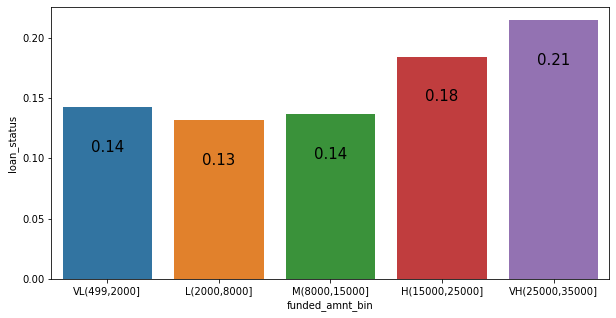

In [22]:
# binning the values
lda['funded_amnt_bin'] = pd.cut(lda['funded_amnt'], [499,2000,8000,15000,25000,35000],labels=["VL(499,2000]", "L(2000,8000]", "M(8000,15000]","H(15000,25000]","VH(25000,35000]"])

plt.figure(figsize=[10,5])
plots = sns.barplot(x="funded_amnt_bin", y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -40), 
                   textcoords='offset points')
plt.show()

The members having high funded amount are more likely to default

#### 3.1b) Analyzing on 'term'

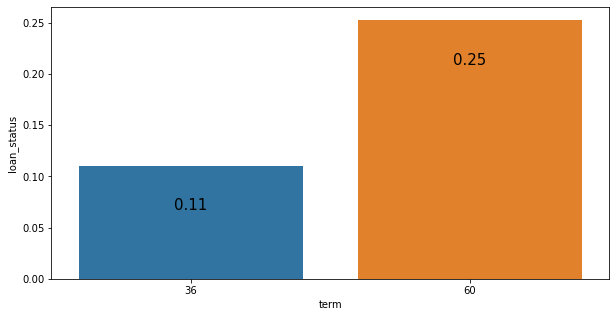

In [23]:
plt.figure(figsize=[10,5])
plots = sns.barplot(x="term", y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -40), 
                   textcoords='offset points')
plt.show()

The members who opted for 60 months term are more likely to default

#### 3.1c) Analyzing on 'int_rate'

In [24]:
# Knowing about values in 'int_rate'
lda['int_rate'].describe()

count    38525.000000
mean        11.927523
std          3.690173
min          5.420000
25%          8.940000
50%         11.710000
75%         14.350000
max         24.400000
Name: int_rate, dtype: float64

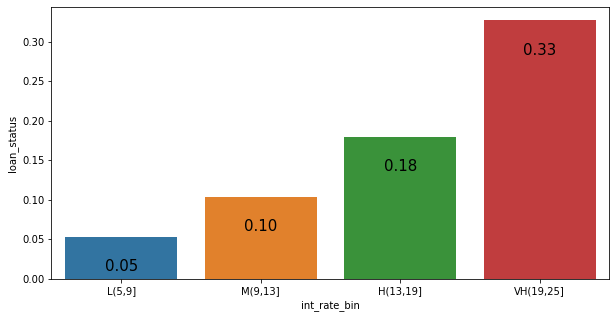

In [25]:
# binning the values
lda['int_rate_bin'] = pd.cut(lda['int_rate'], [5,8,11,18,25],labels=["L(5,9]", "M(9,13]", "H(13,19]","VH(19,25]"])

plt.figure(figsize=[10,5])
plots = sns.barplot(x="int_rate_bin", y="loan_status", data=lda, ci = None, estimator= np.mean) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

The members who's loan interest is high are more likely to default

#### 3.1d) Analyzing on 'emp_length'

Considering the values as follows <br>
 '< 1 year' as '0'  <br>
 '10+ years' as '10'

In [26]:
# Taking new dataframe since emp_length has null values
lda_emplen = lda[~(lda['emp_length'].isna())]

# Converting '< 1 year' to 0
lda_emplen['emp_length']=lda_emplen['emp_length'].apply(lambda x : '0' if x == '< 1 year' else x)

# Extracting only integers and converting the column type to int
lda_emplen['emp_length']=lda_emplen['emp_length'].apply(lambda x : re.findall(r'\d+',x)[0]).astype(int)


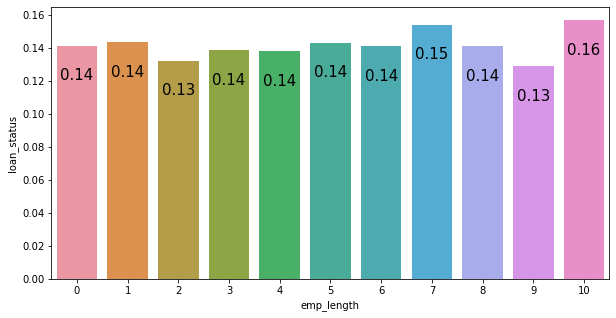

In [27]:
# binning the values
#lda_emplen['emp_length_bin'] = pd.cut(lda_emplen['emp_length'], [0,2,5,8,10],labels=["L(0,3]", "M(3,6]", "H(6,9]","VH(9,10]"])

plt.figure(figsize=[10,5])
plots = sns.barplot(x="emp_length", y="loan_status", data=lda_emplen, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

The members employment length is more than 10years are more likely to default

#### 3.1e) Analyzing on 'home_ownership'

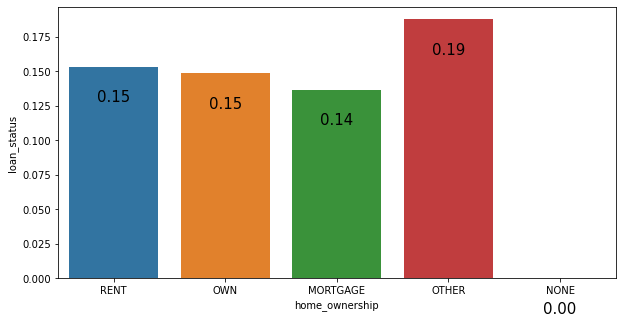

In [28]:
plt.figure(figsize=[10,5])
plots = sns.barplot(x="home_ownership", y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

The members who mentioned home ownership as 'OTHER' are more likely to default

#### 3.1f) Analyzing on 'annual_inc'

In [29]:
# Knowing about values in 'annual_inc'
lda['annual_inc'].describe()

count    3.852500e+04
mean     6.880719e+04
std      6.421591e+04
min      4.000000e+03
25%      4.000000e+04
50%      5.900000e+04
75%      8.200000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64

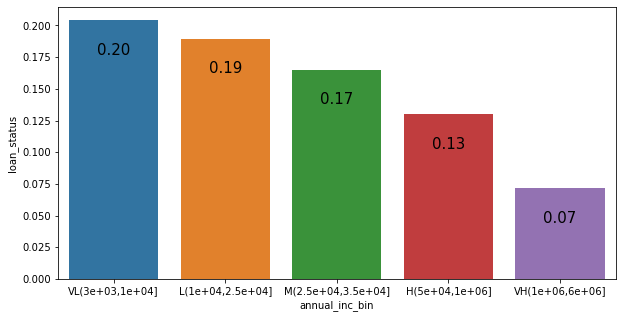

In [30]:
# binning the values
lda['annual_inc_bin'] = pd.cut(lda['annual_inc'], [3999,10000,25000,50000,1000000,6000000],labels=["VL(3e+03,1e+04]", "L(1e+04,2.5e+04]", "M(2.5e+04,3.5e+04]","H(5e+04,1e+06]","VH(1e+06,6e+06]"])

# knowing the data before plotting
pd.pivot_table(data=lda, index="loan_status",values="funded_amnt",columns="annual_inc_bin", aggfunc=sum)

plt.figure(figsize=[10,5])
plots = sns.barplot(x="annual_inc_bin", y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

The members who's income is low are more likely to default

#### 3.1g) Analyzing on 'verification_status'

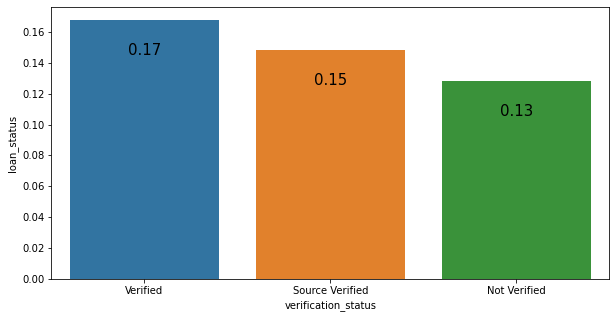

In [31]:
plt.figure(figsize=[10,5])
plots = sns.barplot(x="verification_status", y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

#### 3.1h) Analyzing on 'issue_d'

In [32]:
lda['issue_d_month'] = lda['issue_d'].apply(lambda x:x[0:3])
lda['issue_d_year'] = lda['issue_d'].apply(lambda x:x[-2:])

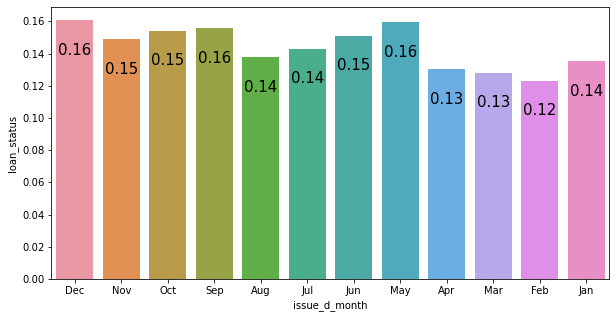

In [33]:
plt.figure(figsize=[10,5])
plots = sns.barplot(x="issue_d_month" , y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

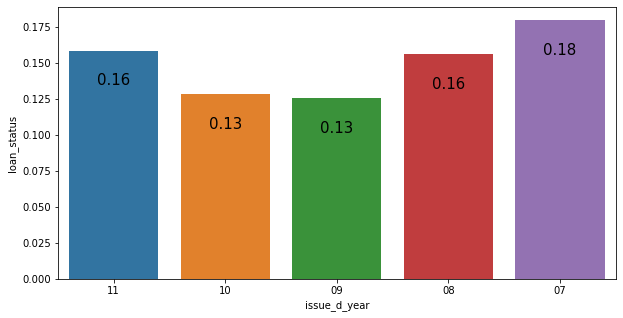

In [34]:
plt.figure(figsize=[10,5])
plots = sns.barplot(x="issue_d_year" , y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

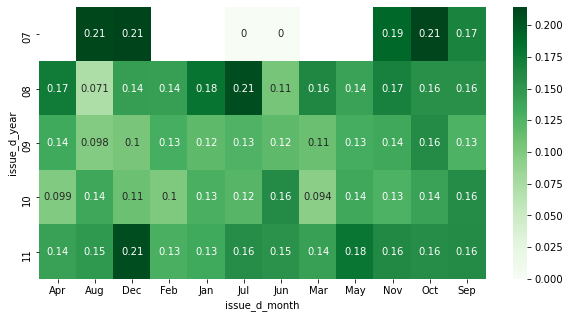

In [35]:
res=pd.pivot_table(data=lda,index="issue_d_year",columns="issue_d_month",values="loan_status",aggfunc=np.mean)
plt.figure(figsize=[10,5])
sns.heatmap(res,cmap="Greens", annot=True)
plt.show()

DEC, SEP & MAY months are having more likely to default

#### 3.1i) Analyzing on 'purpose'

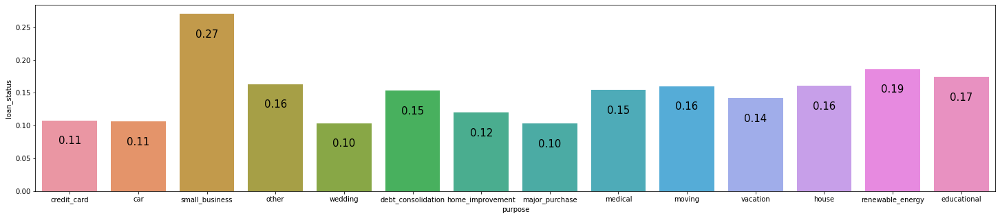

In [36]:
plt.figure(figsize=[25,5])
plots = sns.barplot(x="purpose" , y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

Members with small_business as purpose more likely to default

#### 3.1j) Analyzing on 'dti'

In [37]:
# Knowing about values in 'dti'
lda['dti'].describe()

count    38525.000000
mean        13.276920
std          6.671089
min          0.000000
25%          8.140000
50%         13.370000
75%         18.560000
max         29.990000
Name: dti, dtype: float64

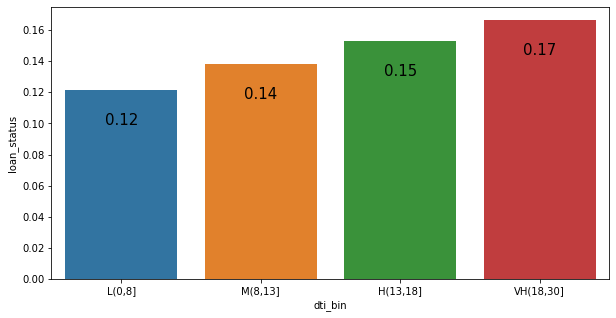

In [38]:
# binning the values
lda['dti_bin'] = pd.cut(lda['dti'], [0,8,13,18,30],labels=["L(0,8]", "M(8,13]", "H(13,18]","VH(18,30]"])

plt.figure(figsize=[10,5])
plots = sns.barplot(x="dti_bin" , y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

Members with dti more than 18% more likely to default

#### 3.1k) Analyzing on 'inq_last_6mths'

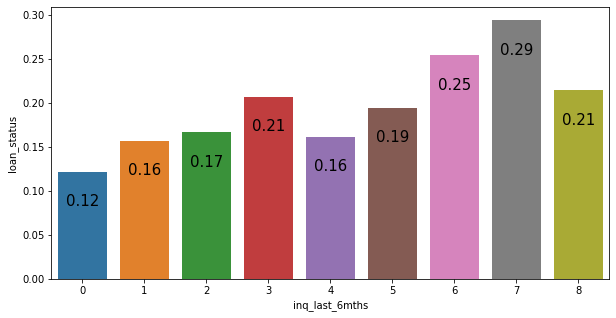

In [39]:
plt.figure(figsize=[10,5])
plots = sns.barplot(x="inq_last_6mths" , y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

Members with 0 inquiry are less likely to default

#### 3.1l) Analyzing on 'open_acc'

In [40]:
# Knowing about values in 'open_acc'
lda['open_acc'].describe()

count    38525.000000
mean         9.281609
std          4.400175
min          2.000000
25%          6.000000
50%          9.000000
75%         12.000000
max         44.000000
Name: open_acc, dtype: float64

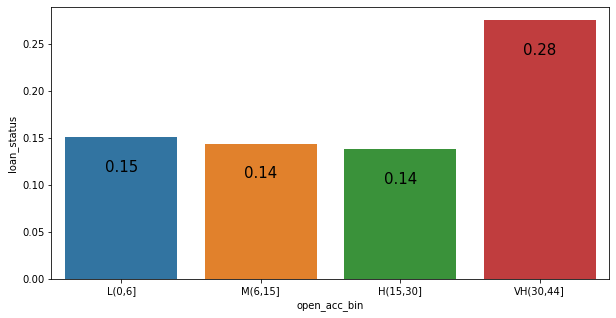

In [41]:
# binning the values
lda['open_acc_bin'] = pd.cut(lda['open_acc'], [0,6,15,30,44],labels=["L(0,6]", "M(6,15]", "H(15,30]","VH(30,44]"])

plt.figure(figsize=[10,5])
plots = sns.barplot(x="open_acc_bin" , y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

Members with more than 30 open credit lines are more likely to default

#### 3.1m) Analyzing on 'pub_rec'

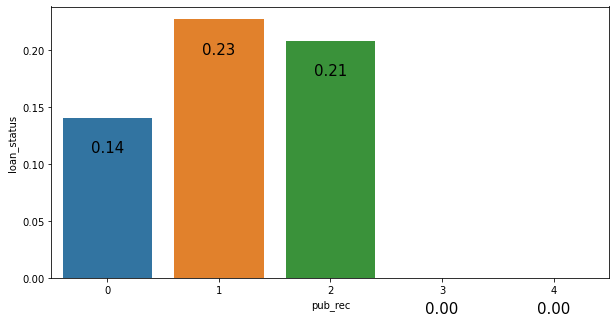

In [42]:
plt.figure(figsize=[10,5])
plots = sns.barplot(x="pub_rec" , y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

Members with 0 public record of derogatory less likely to default

#### 3.1n) Analyzing on 'revol_util'

In [43]:
# Removing % from values and converting it to float
lda['revol_util']=lda['revol_util'].str.replace('%','').astype(float)

In [44]:
lda['revol_util'].describe()

count    38525.000000
mean        48.703114
std         28.364089
min          0.000000
25%         25.200000
50%         49.100000
75%         72.300000
max         99.900000
Name: revol_util, dtype: float64

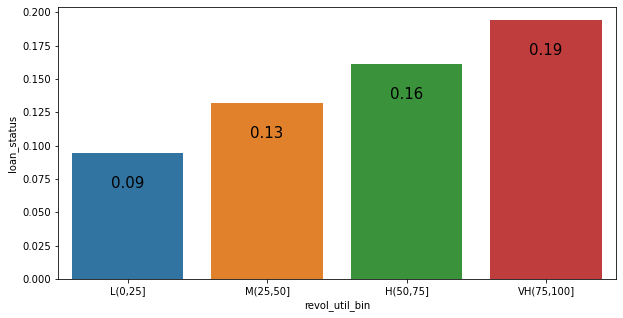

In [45]:
# binning the values
lda['revol_util_bin'] = pd.cut(lda['revol_util'], [0,25,50,75,100],labels=["L(0,25]", "M(25,50]", "H(50,75]","VH(75,100]"])

plt.figure(figsize=[10,5])
plots = sns.barplot(x="revol_util_bin" , y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

Members with high Revolving line utilization rate are more likely to default

#### 3.1o) Analyzing on 'total_acc'

In [46]:
lda['total_acc'].describe()

count    38525.000000
mean        22.067567
std         11.422375
min          2.000000
25%         13.000000
50%         20.000000
75%         29.000000
max         90.000000
Name: total_acc, dtype: float64

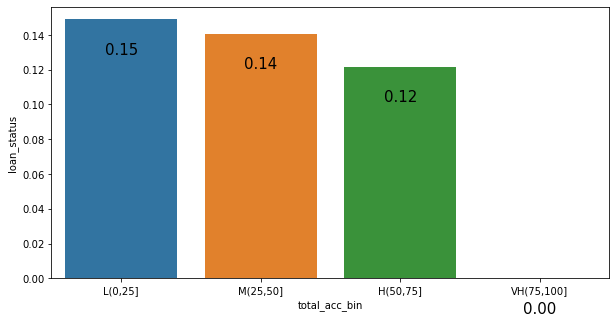

In [47]:
# binning the values
lda['total_acc_bin'] = pd.cut(lda['total_acc'], [0,25,50,75,100],labels=["L(0,25]", "M(25,50]", "H(50,75]","VH(75,100]"])

plt.figure(figsize=[10,5])
plots = sns.barplot(x="total_acc_bin" , y="loan_status", data=lda, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

Members with less number of credit lines are more likely to default

#### 3.1p) Analyzing on 'pub_rec_bankruptcies'

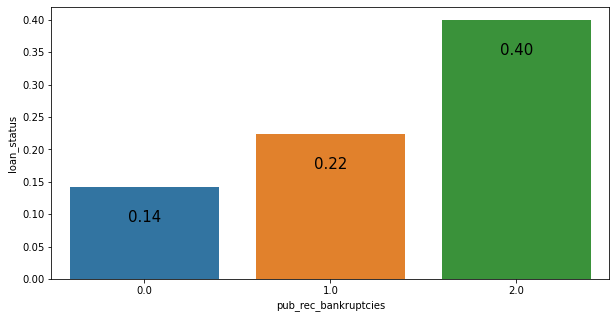

In [48]:
# Taking new dataframe since pub_rec_bankruptcies has null values
lda_pubrecbkrupt = lda[~(lda['pub_rec_bankruptcies'].isna())]

plt.figure(figsize=[10,5])
plots = sns.barplot(x="pub_rec_bankruptcies" , y="loan_status", data=lda_pubrecbkrupt, ci = None) 
for bar in plots.patches: 
    plots.annotate(format(bar.get_height(), '.2f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=15, xytext=(0, -30), 
                   textcoords='offset points')
plt.show()

Members with higher number of public record bankruptcies are more likely to default

#### Plotting all the above univariate together

In [49]:
# Getting all the columns to list for which univariate analysis is performed
Lu = ['funded_amnt_bin','term','int_rate_bin','emp_length','home_ownership','annual_inc_bin','verification_status','issue_d_month','issue_d_year','purpose','dti_bin','inq_last_6mths','open_acc_bin','pub_rec','revol_util_bin','total_acc_bin','pub_rec_bankruptcies']

len(Lu)

17

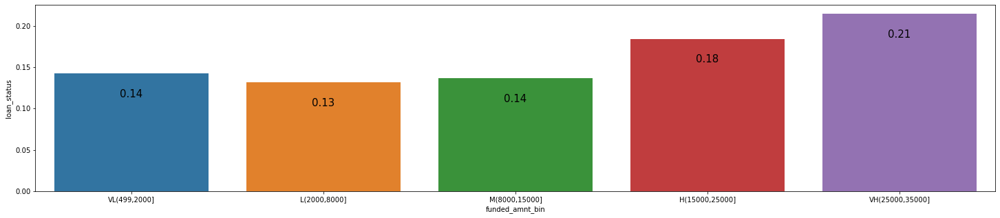

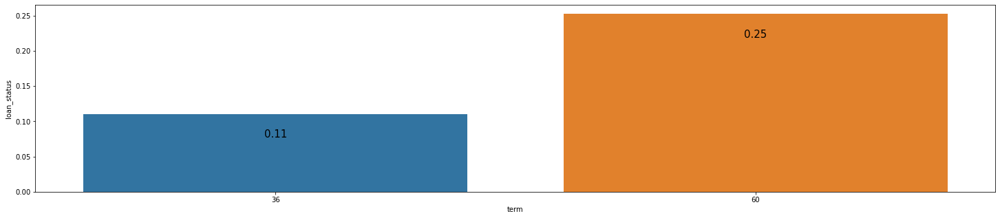

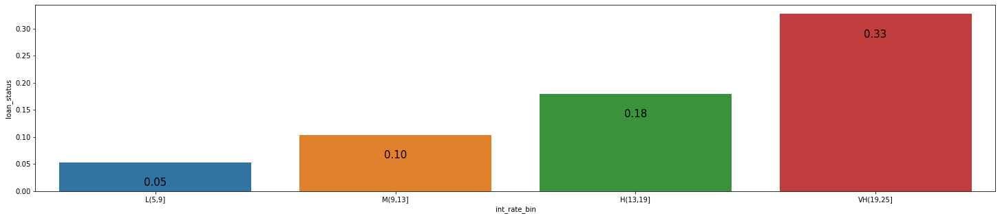

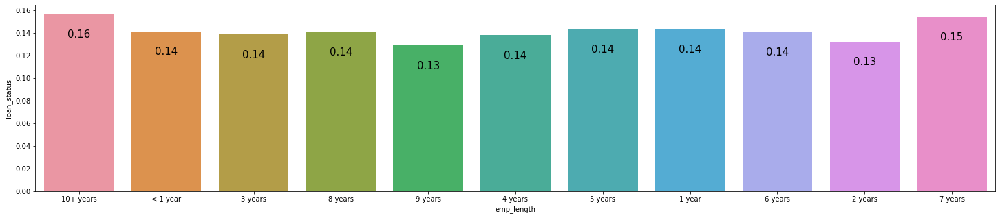

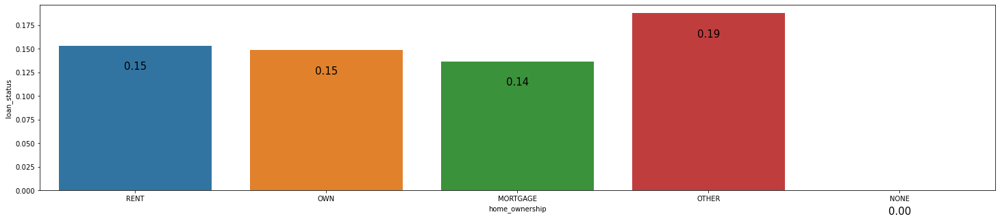

...

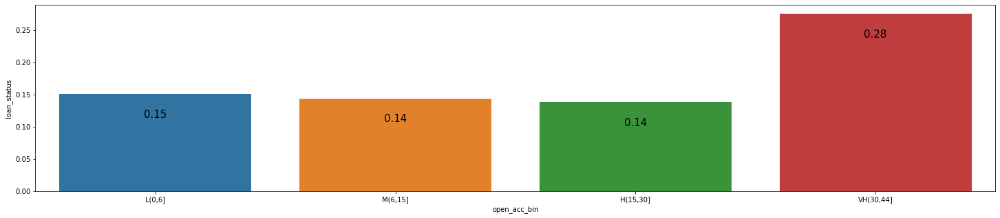

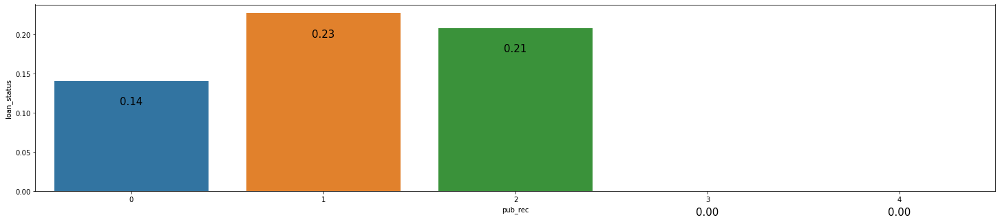

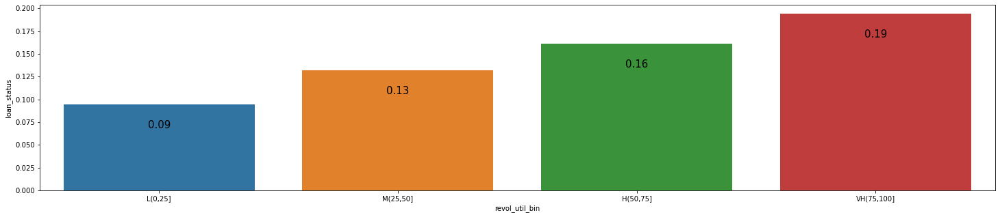

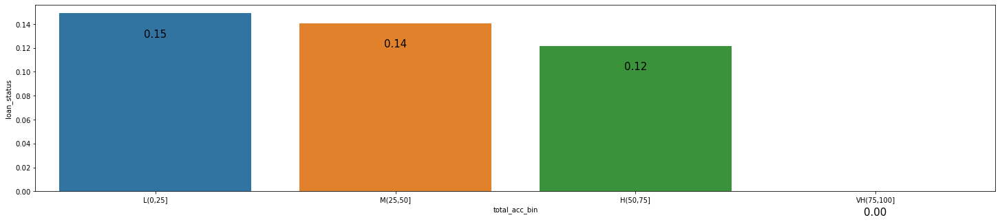

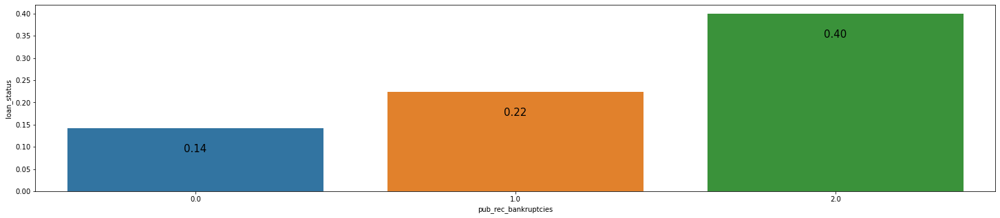

In [50]:
# Plotting all the graphs once again together
for i in Lu:
    plt.figure(figsize=[25,5])
    plots = sns.barplot(x=i , y="loan_status", data=lda, ci = None) 
    for bar in plots.patches: 
        plots.annotate(format(bar.get_height(), '.2f'),  
                       (bar.get_x() + bar.get_width() / 2,  
                        bar.get_height()), ha='center', va='center', 
                       size=15, xytext=(0, -30), 
                       textcoords='offset points')
    plt.show()

In [51]:
# Getting the difference between maximum and minimum values of default percentages
Diff_of_perc = (['funded_amnt_bin',0.21-0.13],['term',0.225-0.11],['int_rate_bin',0.33-0.05],['emp_length',0.16-0.13],['home_ownership',0.19-0.14],['annual_inc_bin',0.21-0.08],['verification_status',0.17-0.13],['issue_d_month',0.16-0.12],['issue_d_year',0.18-0.13],['purpose',0.27-0.10],['dti_bin',0.17-0.12],['inq_last_6mths',0.29-0.12],['open_acc_bin',0.30-0.14],['pub_rec',0.23-0.00],['revol_util_bin',0.19-0.10],['total_acc_bin',0.15-0.00],['pub_rec_bankruptcies',0.40-0.14])

# Sorting the differences in descending order
Diff_of_perc_sorted =sorted(Diff_of_perc, key = lambda x : x[1], reverse=True)

Diff_of_perc_sorted

[['int_rate_bin', 0.28],
 ['pub_rec_bankruptcies', 0.26],
 ['pub_rec', 0.23],
 ['purpose', 0.17],
 ['inq_last_6mths', 0.16999999999999998],
 ['open_acc_bin', 0.15999999999999998],
 ['total_acc_bin', 0.15],
 ['annual_inc_bin', 0.13],
 ['term', 0.115],
 ['revol_util_bin', 0.09],
 ['funded_amnt_bin', 0.07999999999999999],
 ['dti_bin', 0.05000000000000002],
 ['home_ownership', 0.04999999999999999],
 ['issue_d_year', 0.04999999999999999],
 ['verification_status', 0.04000000000000001],
 ['issue_d_month', 0.04000000000000001],
 ['emp_length', 0.03]]

# 

# 4) Bi and multivariate analysis

In [52]:
# Getting all the columns to list for which univariate analysis is performed
SLu = []
for i in Diff_of_perc_sorted:
        SLu.append(i[0]) 
SLu
#print(SLu)

['int_rate_bin',
 'pub_rec_bankruptcies',
 'pub_rec',
 'purpose',
 'inq_last_6mths',
 'open_acc_bin',
 'total_acc_bin',
 'annual_inc_bin',
 'term',
 'revol_util_bin',
 'funded_amnt_bin',
 'dti_bin',
 'home_ownership',
 'issue_d_year',
 'verification_status',
 'issue_d_month',
 'emp_length']

##### Plotting the each column with all the other columns for which univariate analysis is done

In [53]:
# defining a function to get all columns except the specified columns provided as input
def Col_list(*x):
    Li = []
    for i in SLu:
        Li.append(i)
    for j in x:
        Li.remove(j)
    return Li

While plotting heatmaps with one column vs all the columns, there will be repetition of heatmaps.
e.g: int_rate_bin vs pub_rec_bankruptcies heatmap is same as pub_rec_bankruptcies vs int_rate_bin

The above function is used so that plotting repeated heatmaps are eliminated

#### 4.1a) Plotting 'int_rate_bin' with all other remaining columns

['pub_rec_bankruptcies', 'pub_rec', 'purpose', 'inq_last_6mths', 'open_acc_bin', 'total_acc_bin', 'annual_inc_bin', 'term', 'revol_util_bin', 'funded_amnt_bin', 'dti_bin', 'home_ownership', 'issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


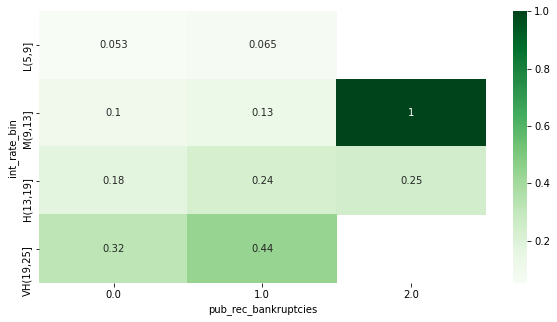

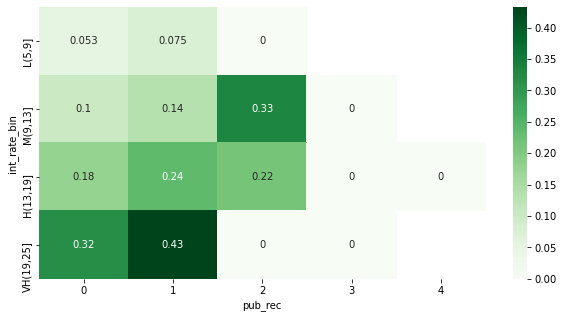

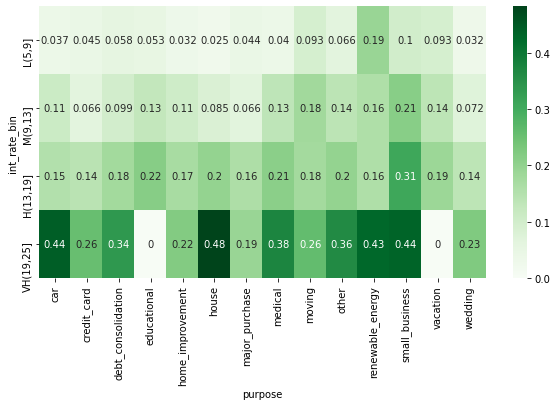

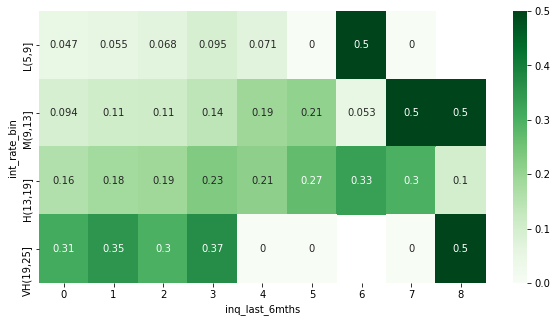

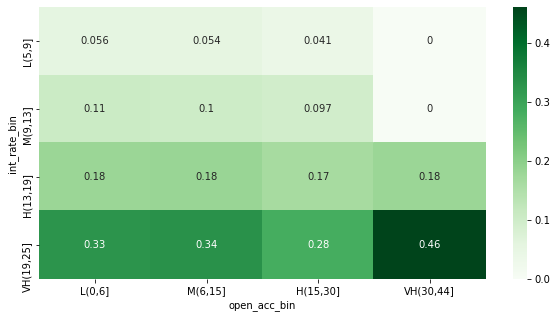

...

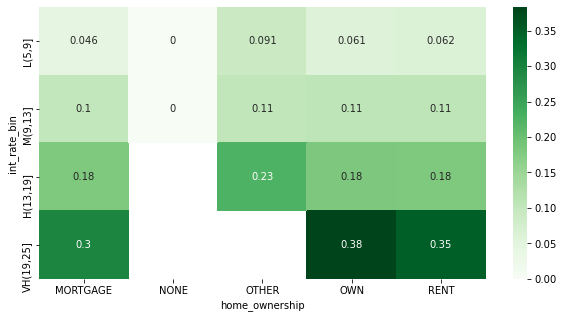

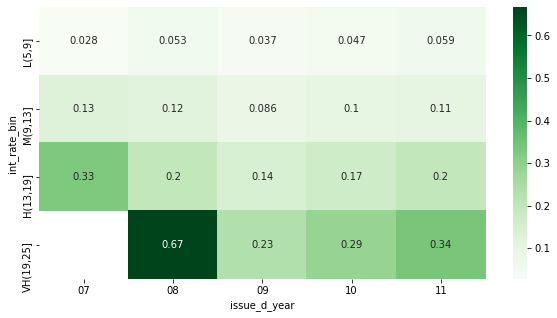

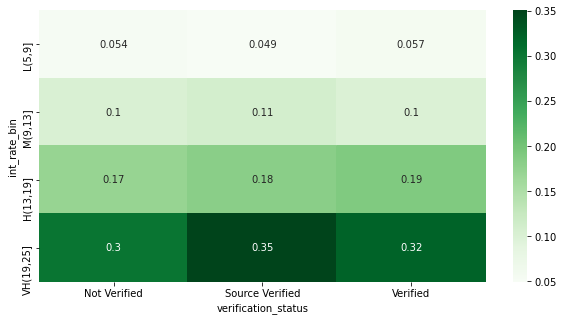

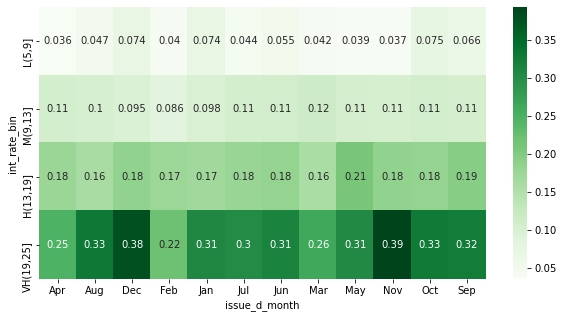

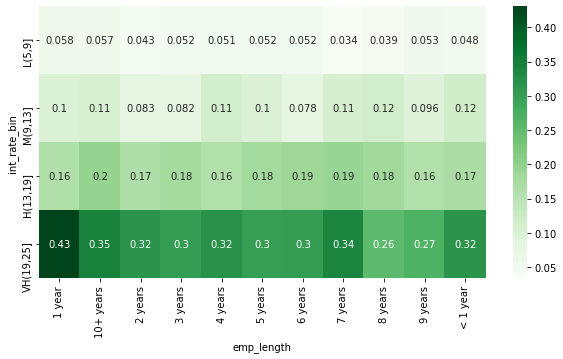

In [54]:
# Getting list of all the columns except given input('int_rate_bin')
SLb = Col_list('int_rate_bin')
print(SLb)

# Getting heat maps for given input('int_rate_bin') vs all other remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='int_rate_bin',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

For the plots:<br>

1) int_rate_bin vs total_acc_bin<br>
    the defaulters rate increases with the increase in int_rate_bin and decrease in total_acc_bin

2) int_rate_bin vs annual_acc_bin<br>
    the defaulters rate increases with the increase in int_rate_bin and decrease in annual_inc_bin
    
3) int_rate_bin vs term<br>
    the defaulters rate increases with the increase in int_rate_bin and increase in term
      
4) int_rate_bin vs revol_util_bin<br>
    the defaulters rate increases with the increase in int_rate_bin and increase in revol_util_bin

5) int_rate_bin vs funded_amnt_bin<br>
    the defaulters rate increases independently with the increase in int_rate_bin irrespective of funded_amnt_bin

6) int_rate_bin vs dti_bin<br>
    the defaulters rate increases independently with the increase in int_rate_bin irrespective of funded_amnt_bin

7) int_rate_bin vs verification_status<br>
    the defaulters rate increases independently with the increase in int_rate_bin irrespective of verification_status

8) int_rate_bin vs issue_d_month<br>
    the defaulters rate increases independently with the increase in int_rate_bin irrespective of issue_d_month

9) int_rate_bin vs emp_length<br>
    the defaulters rate increases independently with the increase in int_rate_bin irrespective of emp_length


###### Plotting bar graphs for the above insights

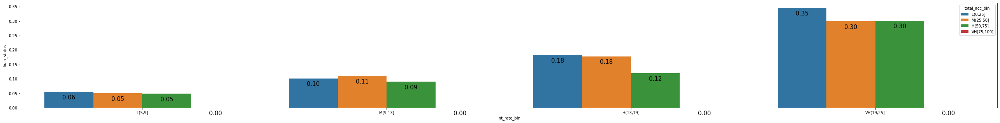

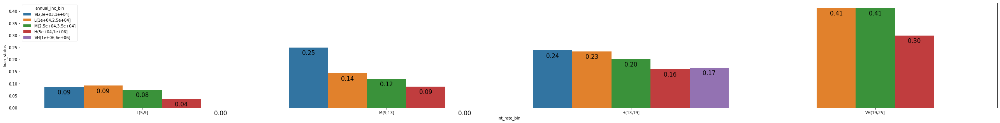

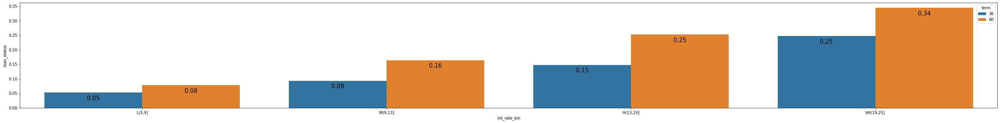

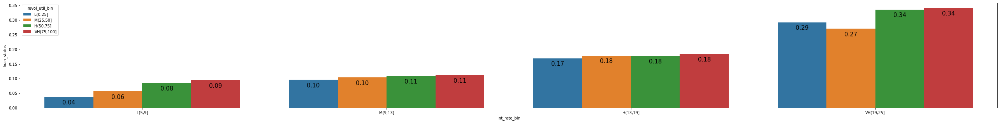

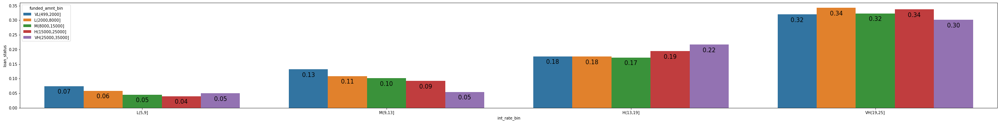

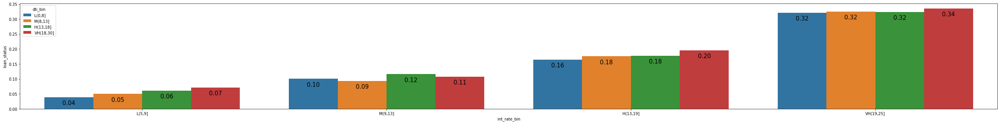

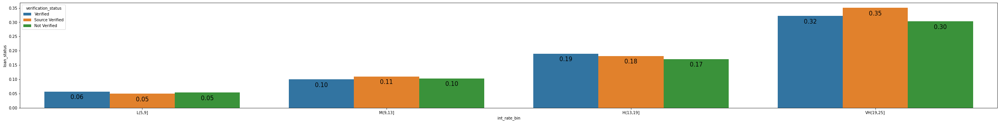

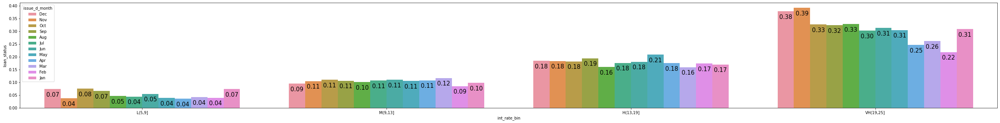

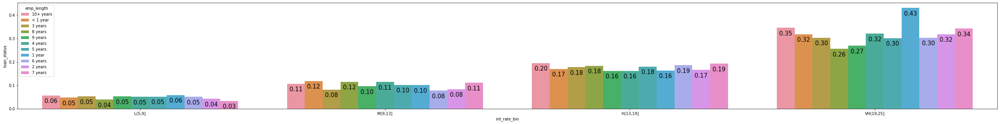

In [55]:
Lt = ['total_acc_bin','annual_inc_bin','term','revol_util_bin','funded_amnt_bin','dti_bin','verification_status','issue_d_month','emp_length']

for i in Lt:
    plt.figure(figsize=[45,5])
    plots = sns.barplot(x='int_rate_bin' , y="loan_status", hue = i, data=lda, ci = None) 
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                    (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                    size=15, xytext=(0, -15), 
                    textcoords='offset points')
    plt.show()


#### 4.1b) Plotting 'pub_rec_bankruptcies' with all other remaining columns

['pub_rec', 'purpose', 'inq_last_6mths', 'open_acc_bin', 'total_acc_bin', 'annual_inc_bin', 'term', 'revol_util_bin', 'funded_amnt_bin', 'dti_bin', 'home_ownership', 'issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


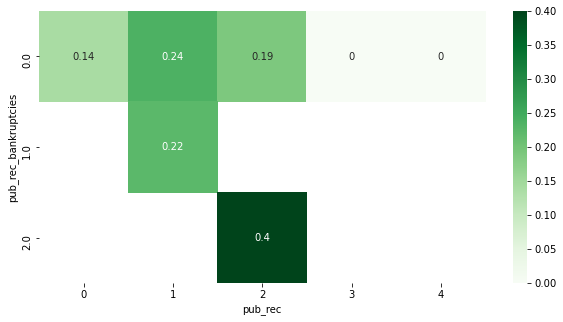

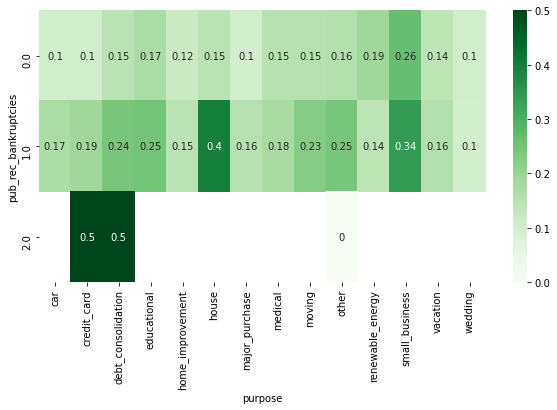

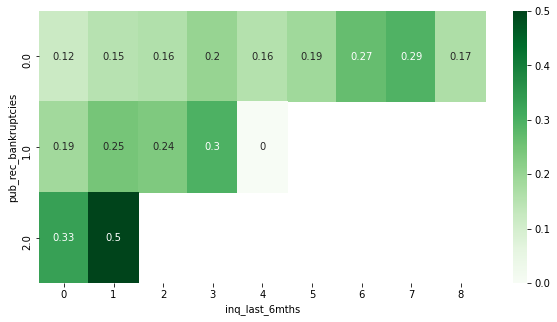

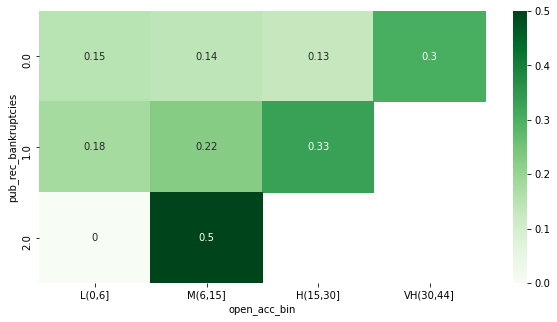

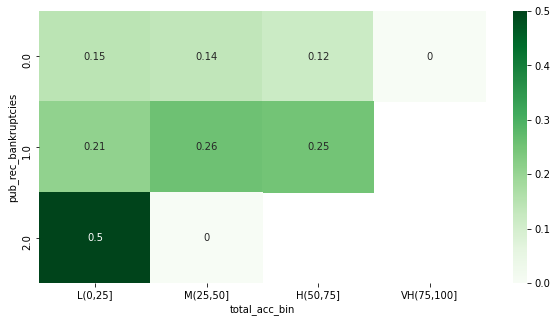

...

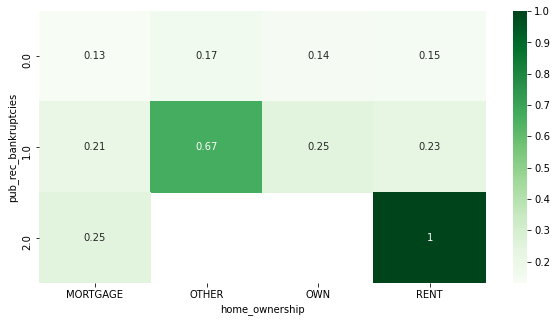

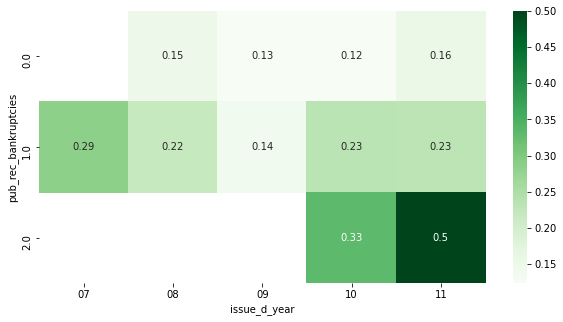

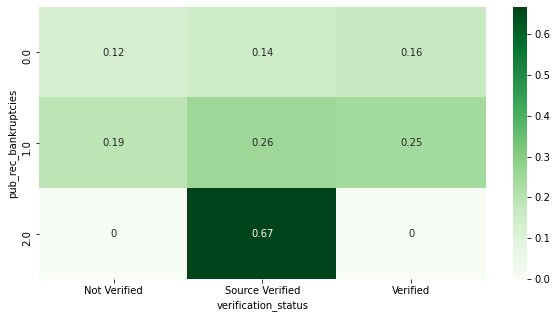

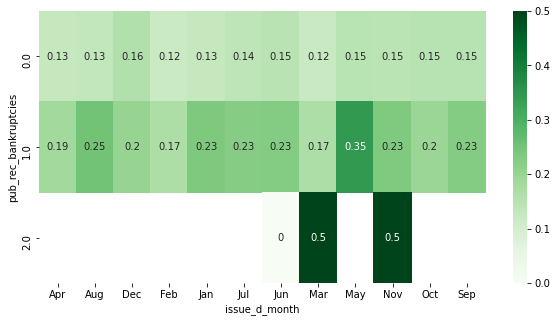

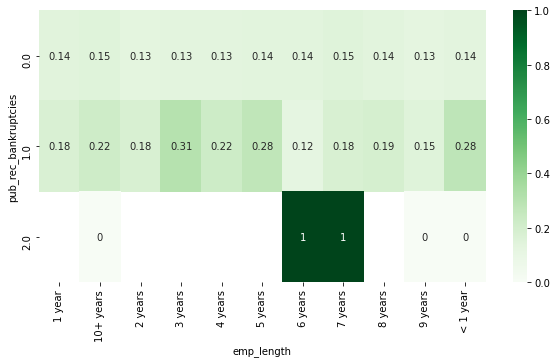

In [56]:
# Getting list of all the columns except given input
SLb = Col_list('pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for given input vs all other remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='pub_rec_bankruptcies',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

For the plots:

1) pub_rec_bankruptcies vs term<br>
    the defaulters rate increases with the increase in pub_rec_bankruptcies and increase in term
      

2) pub_rec_bankruptcies vs verification_status<br>
    the defaulters rate increases independently with the increase in pub_rec_bankruptcies irrespective of verification_status


###### Plotting bar graphs for the above insights

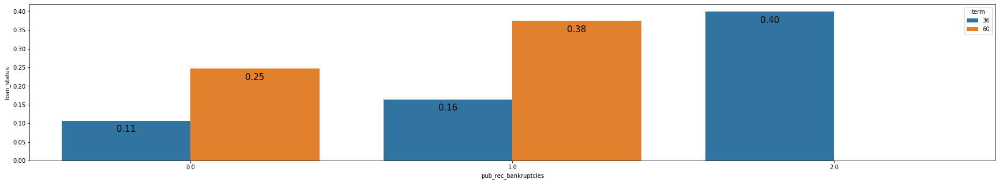

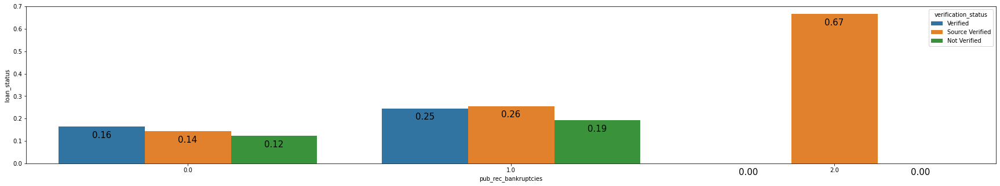

In [57]:
Lt = ['term','verification_status']

for i in Lt:
    plt.figure(figsize=[30,5])
    plots = sns.barplot(x='pub_rec_bankruptcies' , y="loan_status", hue = i, data=lda, ci = None) 
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                    (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                    size=15, xytext=(0, -15), 
                    textcoords='offset points')
    plt.show()

#### 4.1c) Plotting 'pub_rec' with all other remaining columns

['purpose', 'inq_last_6mths', 'open_acc_bin', 'total_acc_bin', 'annual_inc_bin', 'term', 'revol_util_bin', 'funded_amnt_bin', 'dti_bin', 'home_ownership', 'issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


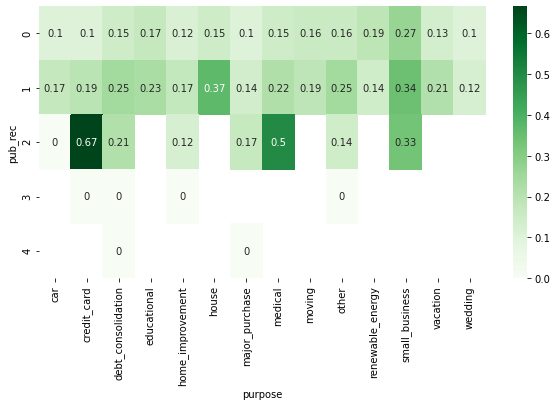

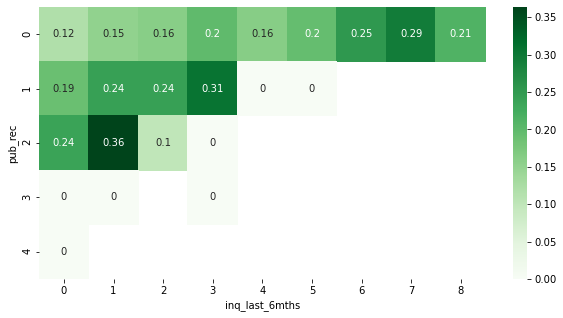

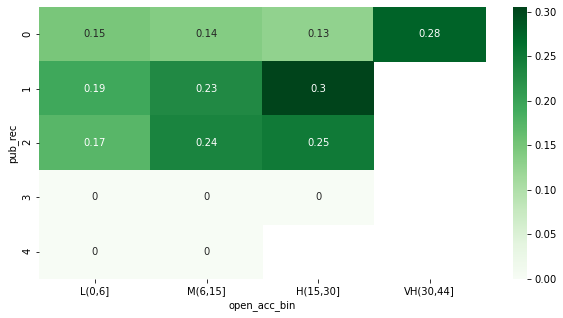

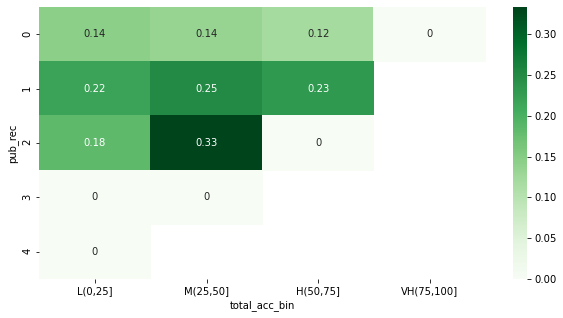

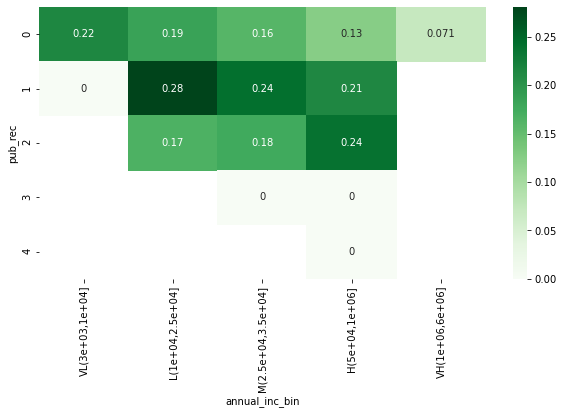

...

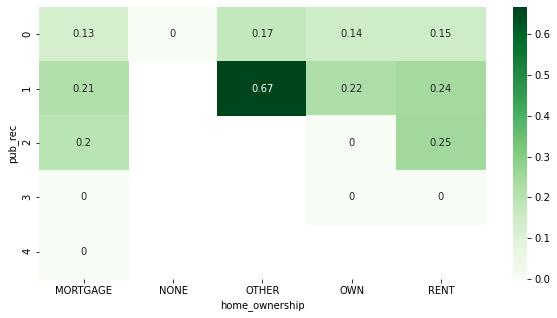

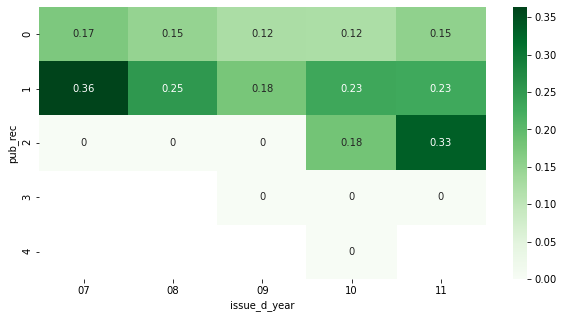

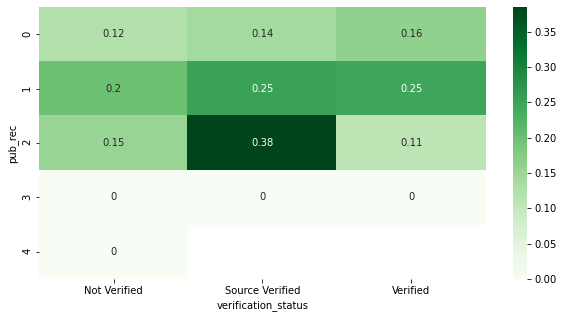

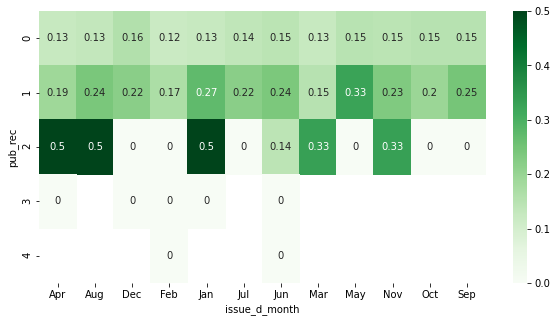

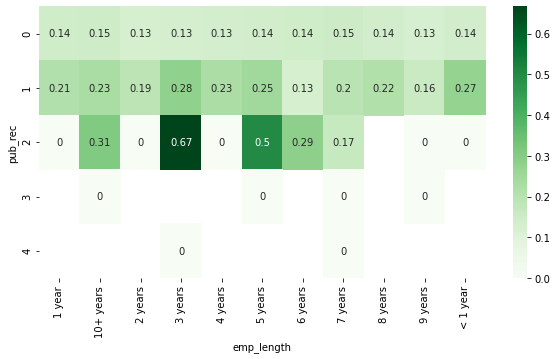

In [58]:
# Getting list of all the columns except given input
SLb = Col_list('pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'pub_rec' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='pub_rec',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

No insights found

#### 4.1d) Plotting 'purpose' with all other remaining columns

['inq_last_6mths', 'open_acc_bin', 'total_acc_bin', 'annual_inc_bin', 'term', 'revol_util_bin', 'funded_amnt_bin', 'dti_bin', 'home_ownership', 'issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


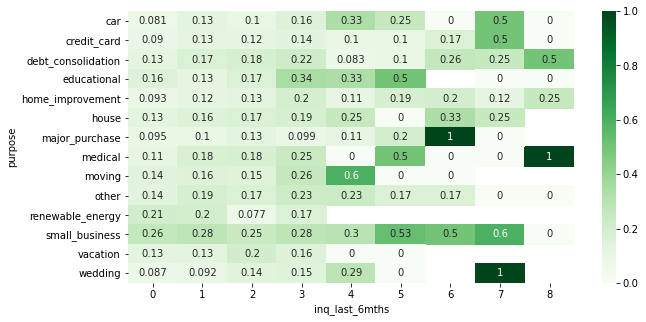

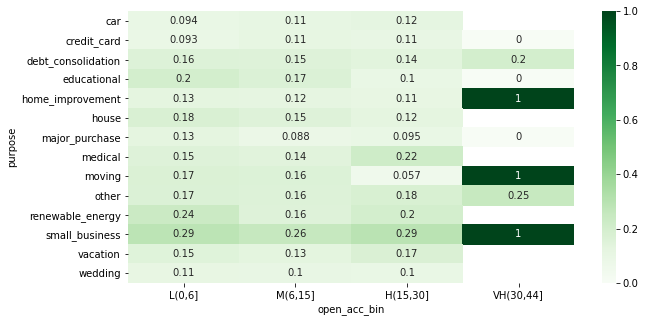

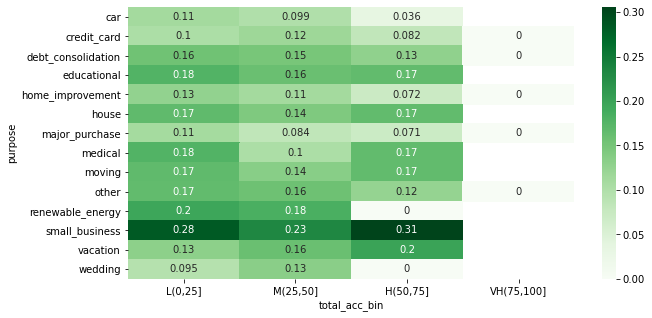

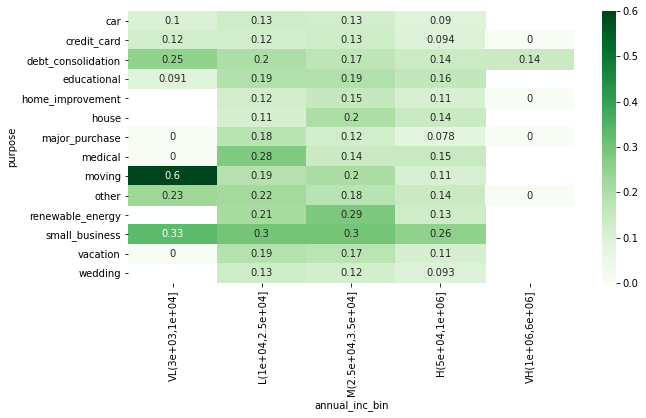

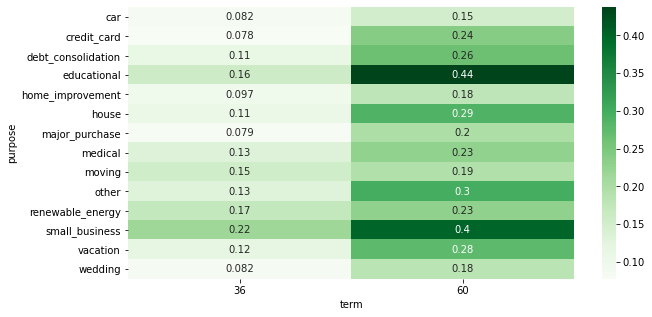

...

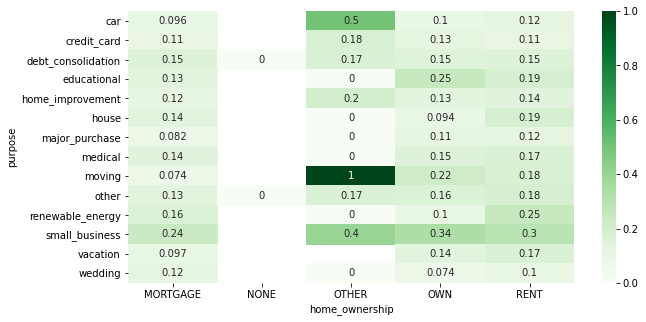

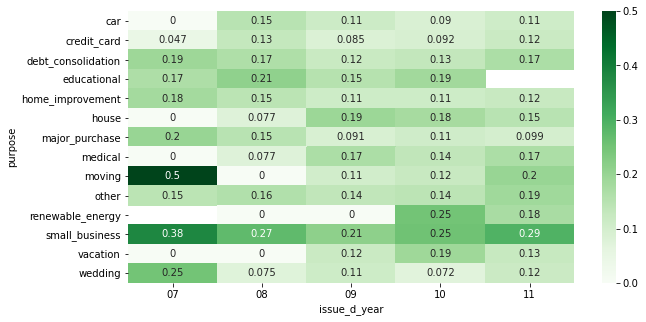

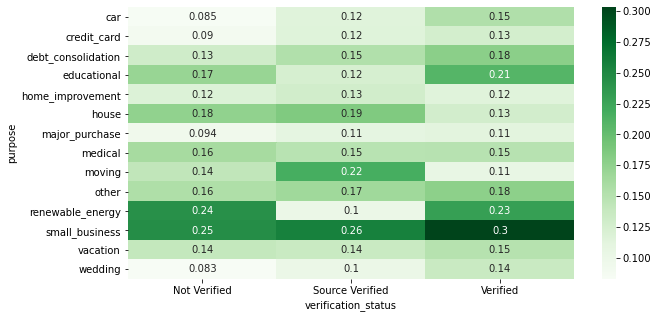

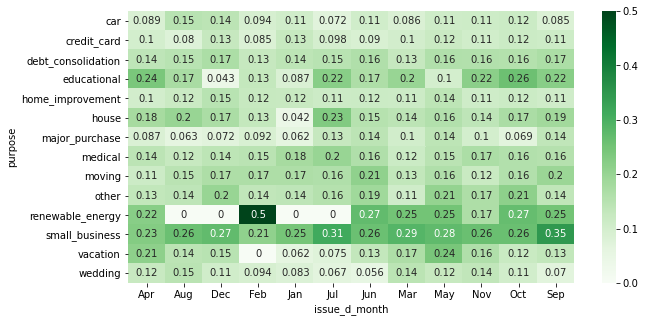

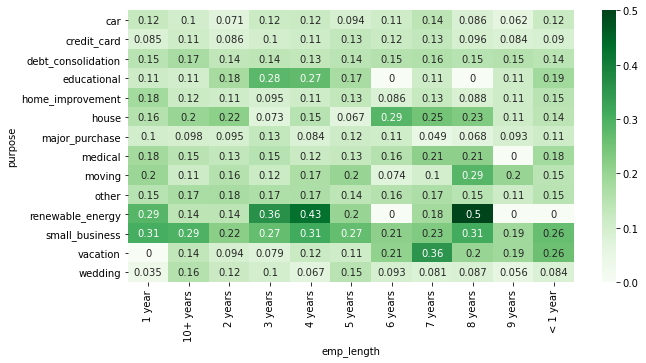

In [59]:
# Getting list of all the columns except given input
SLb = Col_list('purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'purpose' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='purpose',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

For the plots:
    
1) purpose vs term<br>
    the defaulters rate increases independently with the increase in term irrespective of purpose


###### Plotting bar graphs for the above insights

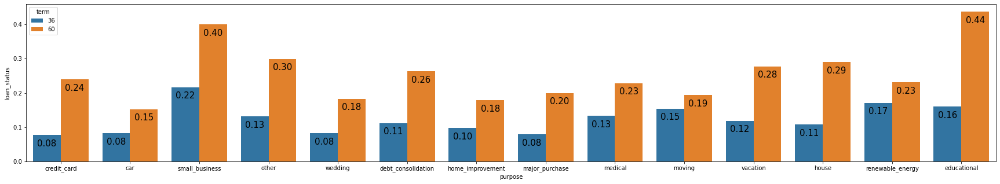

In [60]:
    plt.figure(figsize=[30,5])
    plots = sns.barplot(x='purpose' , y="loan_status", hue = 'term', data=lda, ci = None) 
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                    (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                    size=15, xytext=(0, -15), 
                    textcoords='offset points')
    plt.show()

#### 4.1e) Plotting 'inq_last_6mths' with all other remaining columns

['open_acc_bin', 'total_acc_bin', 'annual_inc_bin', 'term', 'revol_util_bin', 'funded_amnt_bin', 'dti_bin', 'home_ownership', 'issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


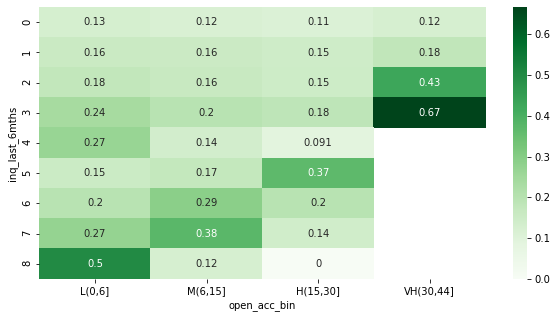

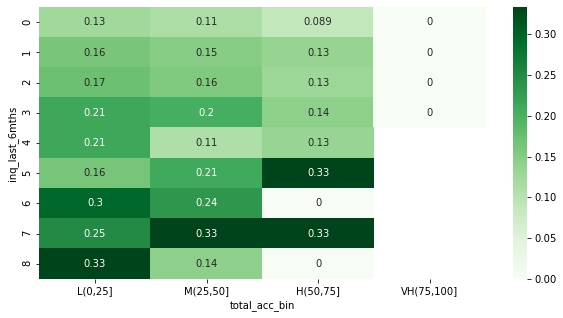

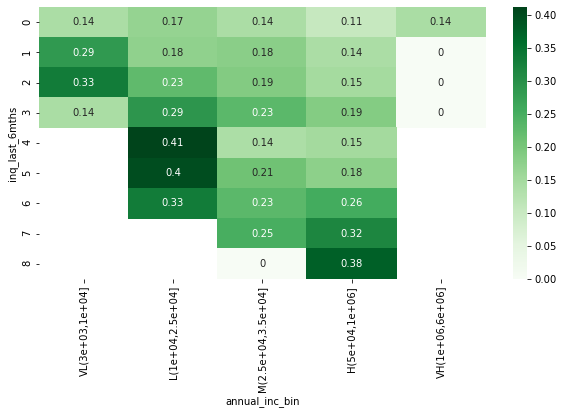

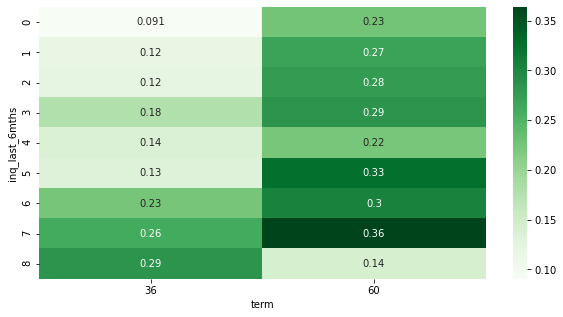

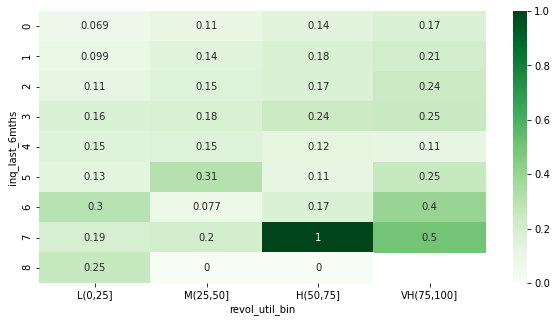

...

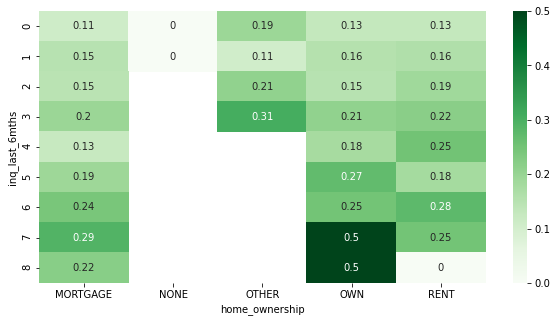

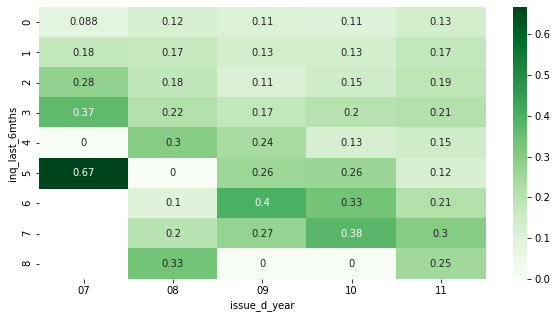

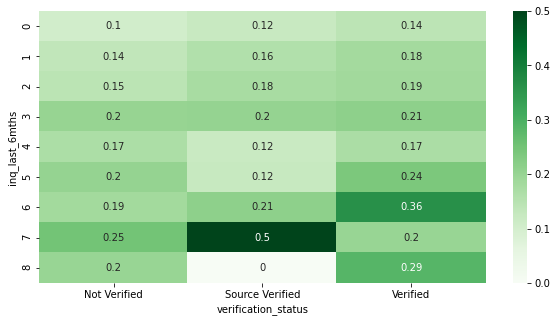

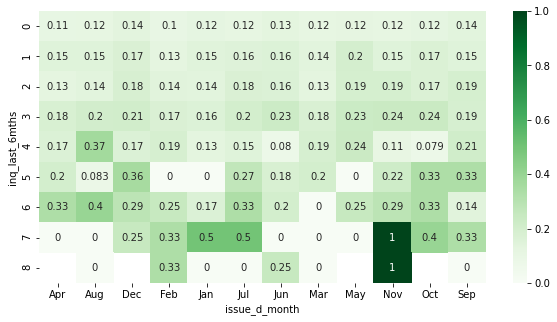

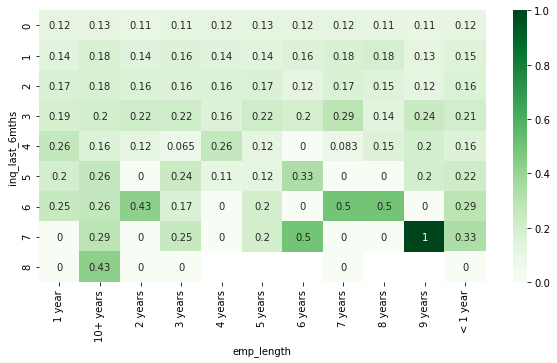

In [61]:
# Getting list of all the columns except given input
SLb = Col_list('inq_last_6mths','purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'inq_last_6mths' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='inq_last_6mths',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

For the plots:

1) inq_last_6mths vs term<br>
    the defaulters rate increases independently with the increase in term irrespective of inq_last_6mths


###### Plotting bar graphs for the above insights

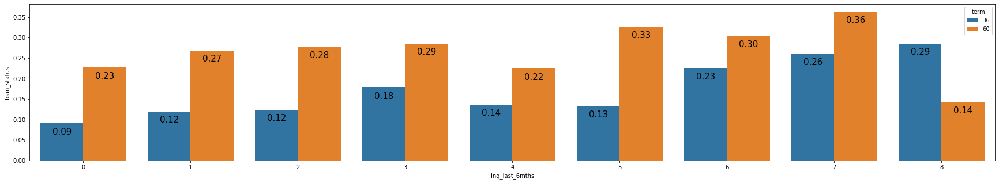

In [62]:
    plt.figure(figsize=[30,5])
    plots = sns.barplot(x='inq_last_6mths' , y="loan_status", hue = 'term', data=lda, ci = None) 
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                    (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                    size=15, xytext=(0, -15), 
                    textcoords='offset points')
    plt.show()

#### 4.1f) Plotting 'open_acc_bin' with all other remaining columns

['total_acc_bin', 'annual_inc_bin', 'term', 'revol_util_bin', 'funded_amnt_bin', 'dti_bin', 'home_ownership', 'issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


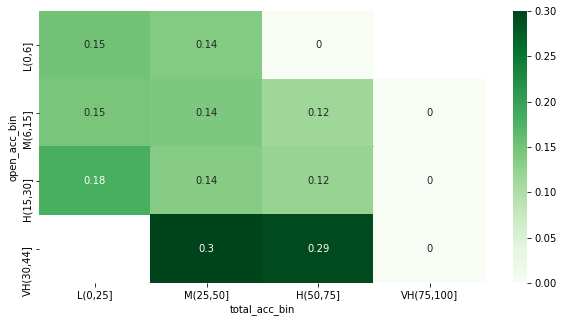

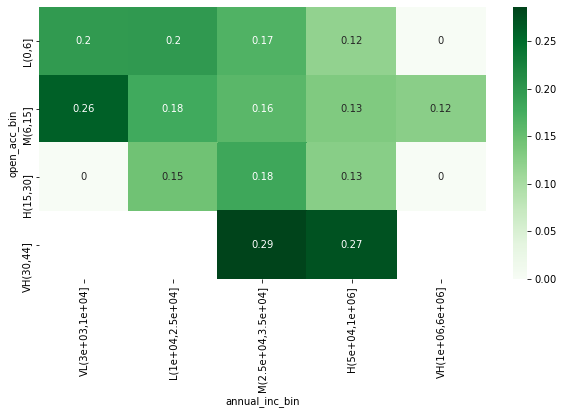

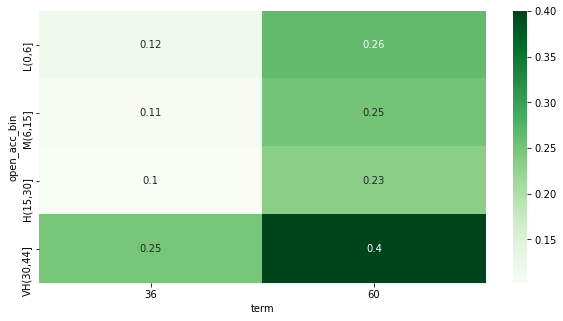

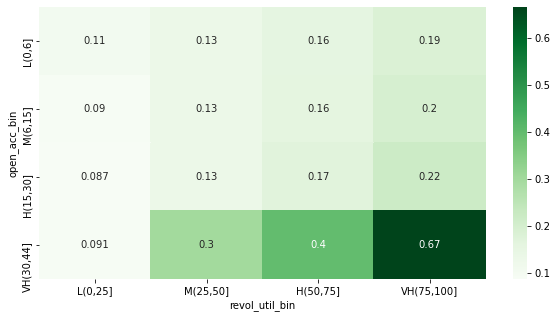

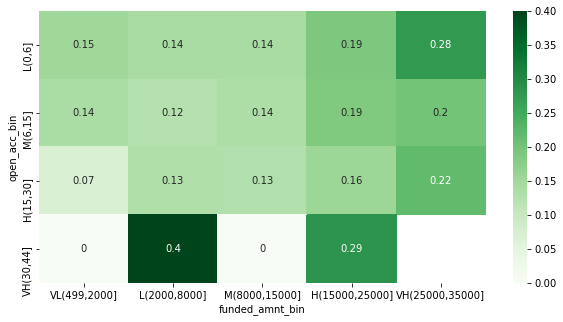

...

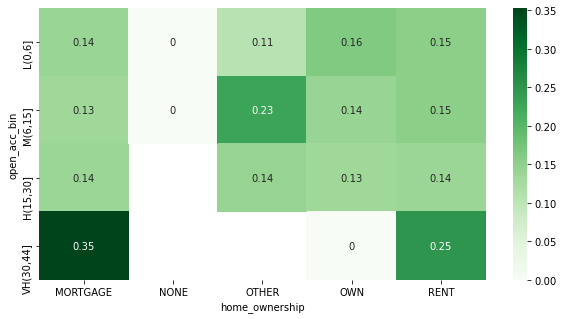

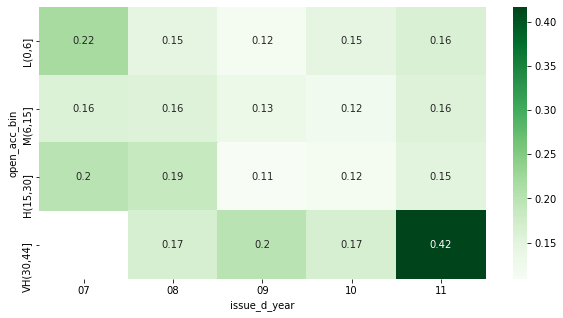

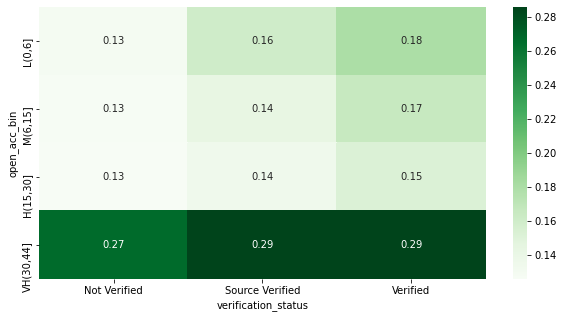

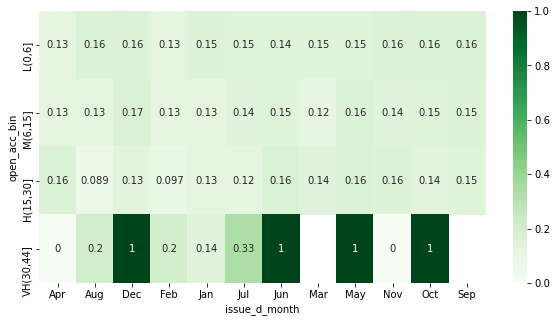

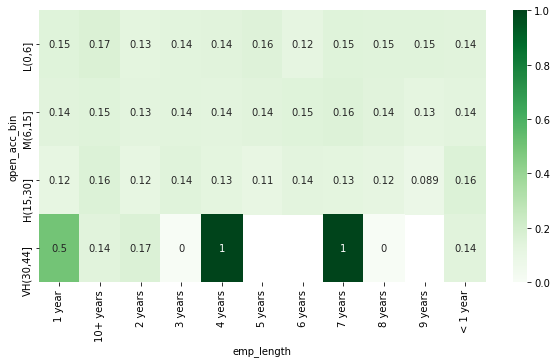

In [63]:
# Getting list of all the columns except given input
SLb = Col_list('open_acc_bin','inq_last_6mths','purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'open_acc_bin' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='open_acc_bin',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

For the plots:

1) open_acc_bin vs term<br>
    the defaulters rate increases independently with the increase in term irrespective of open_acc_bin


2) open_acc_bin vs revol_util_bin<br>
    the defaulters rate increases with the increase in open_acc_bin and increase in revol_util_bin



###### Plotting bar graphs for the above insights

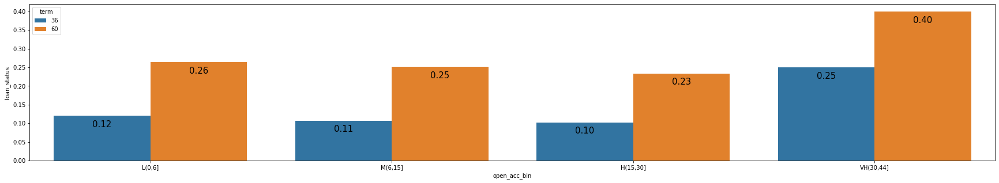

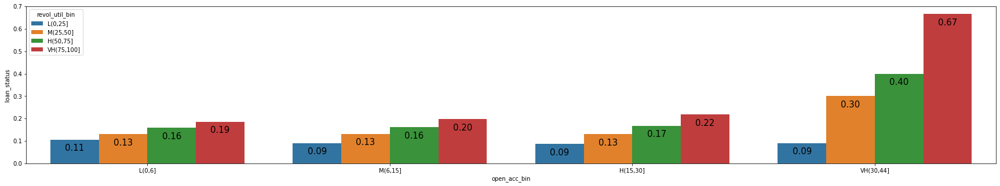

In [64]:
Lt = ['term','revol_util_bin']

for i in Lt:
    plt.figure(figsize=[30,5])
    plots = sns.barplot(x='open_acc_bin' , y="loan_status", hue = i, data=lda, ci = None) 
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                    (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                    size=15, xytext=(0, -15), 
                    textcoords='offset points')
    plt.show()

#### 4.1g) Plotting 'total_acc_bin' with all other remaining columns

['annual_inc_bin', 'term', 'revol_util_bin', 'funded_amnt_bin', 'dti_bin', 'home_ownership', 'issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


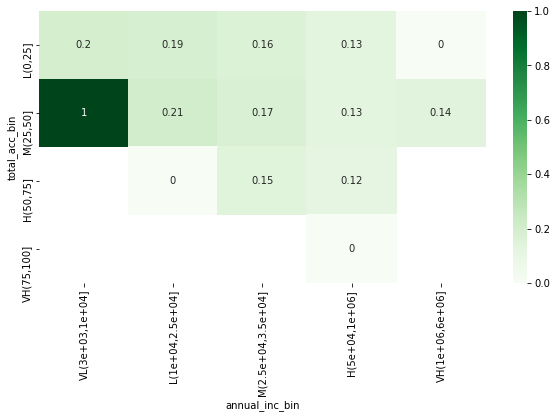

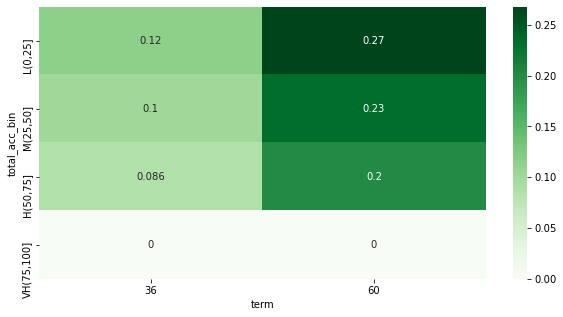

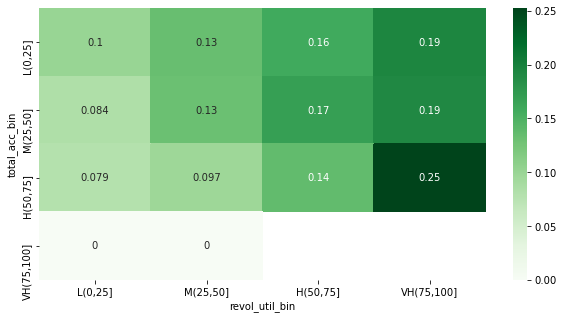

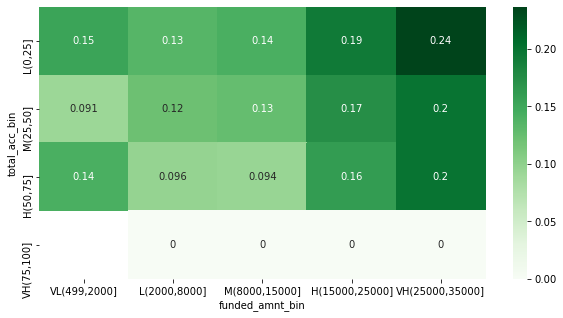

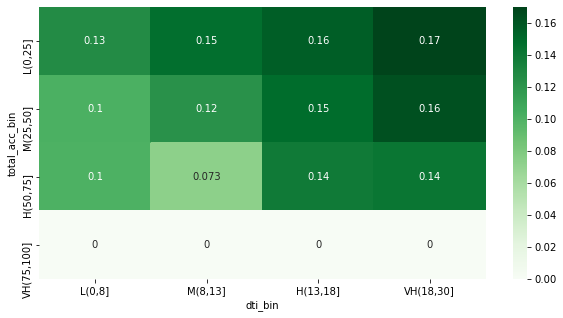

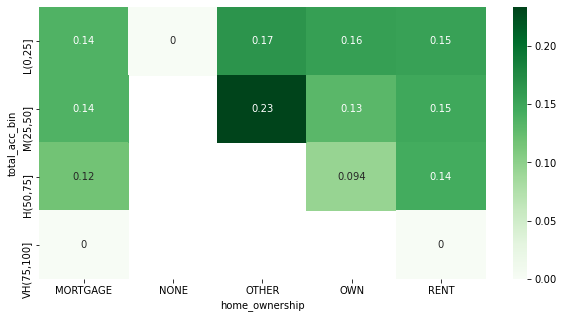

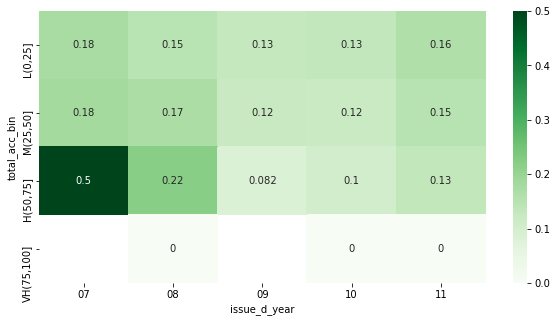

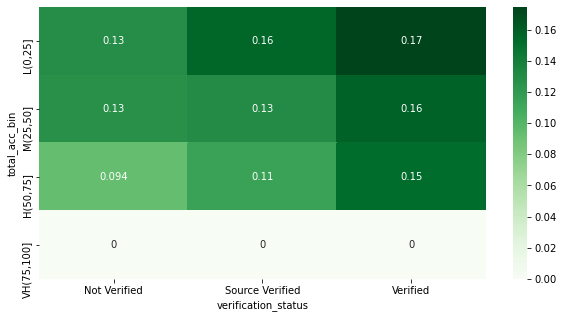

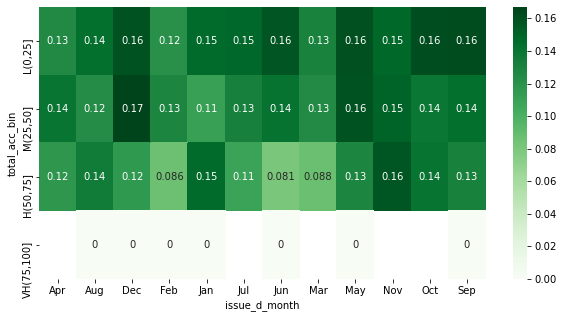

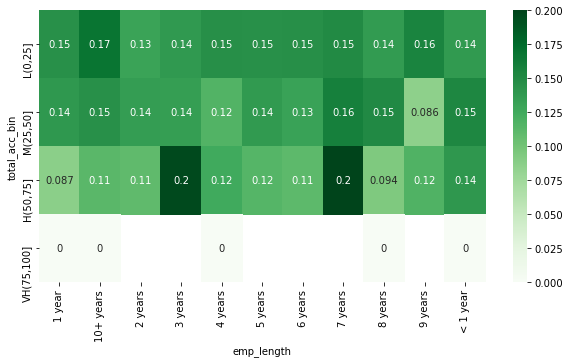

In [65]:
# Getting list of all the columns except given input
SLb = Col_list('total_acc_bin','open_acc_bin','inq_last_6mths','purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'total_acc_bin' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='total_acc_bin',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

For the plots:

1) total_acc_bin vs term<br>
    the defaulters rate increase with the decrease in total_acc_bin and increase with term



###### Plotting bar graphs for the above insights

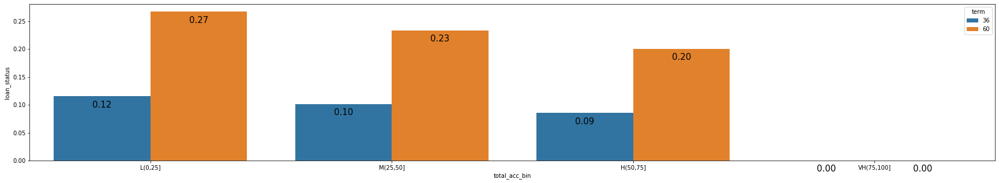

In [66]:
plt.figure(figsize=[30,5])
plots = sns.barplot(x='total_acc_bin' , y="loan_status", hue = 'term', data=lda, ci = None) 
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.2f'),
                (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                    size=15, xytext=(0, -15), 
                    textcoords='offset points')
plt.show()

#### 4.1h) Plotting 'annual_inc_bin' with all other remaining columns

['term', 'revol_util_bin', 'funded_amnt_bin', 'dti_bin', 'home_ownership', 'issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


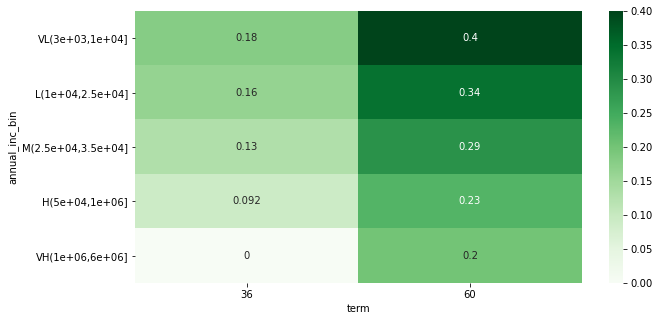

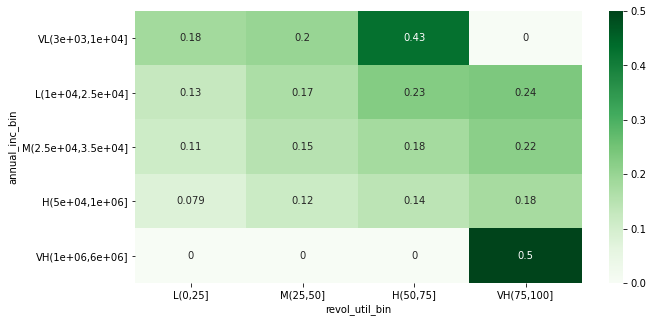

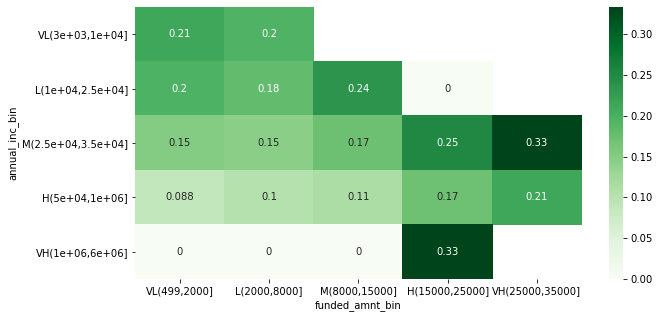

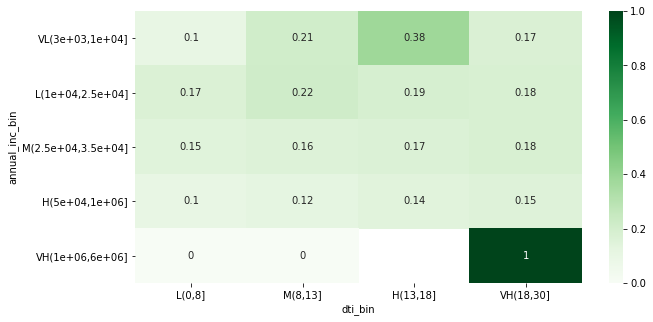

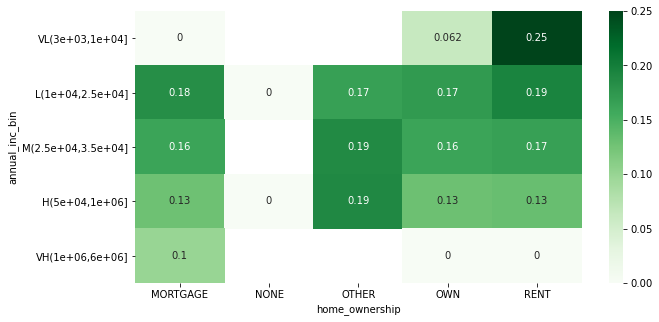

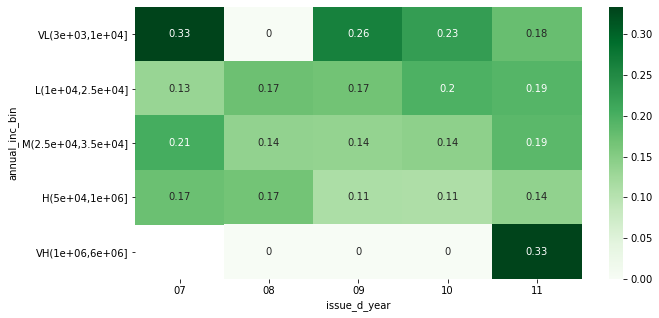

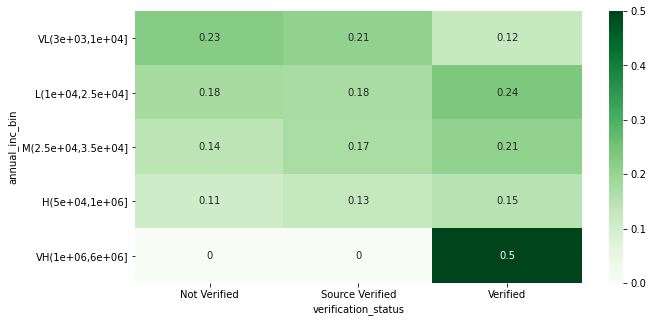

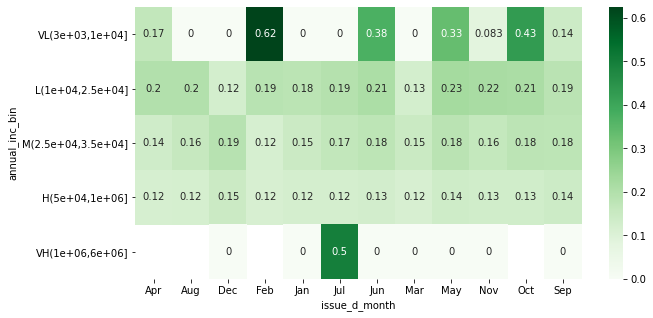

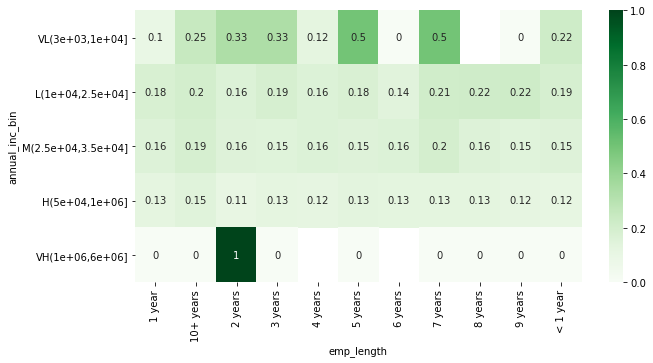

In [67]:
# Getting list of all the columns except given input
SLb = Col_list('annual_inc_bin','total_acc_bin','open_acc_bin','inq_last_6mths','purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'annual_inc_bin' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='annual_inc_bin',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

For the plots:

1) annual_inc_bin vs term<br>
    the defaulters rate increase with the decrease in annual_inc_bin and increase with term

###### Plotting bar graphs for the above insights

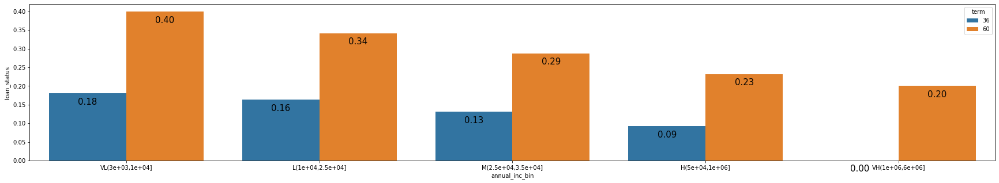

In [68]:
plt.figure(figsize=[30,5])
plots = sns.barplot(x='annual_inc_bin' , y="loan_status", hue = 'term', data=lda, ci = None) 
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.2f'),
                (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                    size=15, xytext=(0, -15), 
                    textcoords='offset points')
plt.show()

#### 4.1i) Plotting 'term' with all other remaining columns

['revol_util_bin', 'funded_amnt_bin', 'dti_bin', 'home_ownership', 'issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


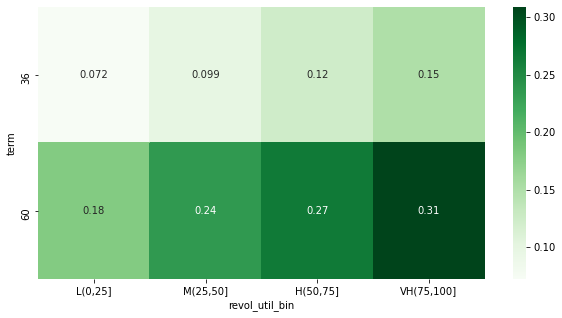

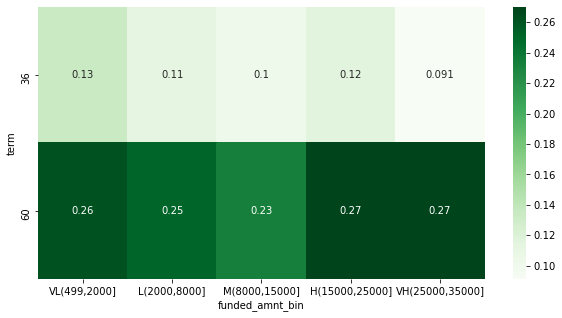

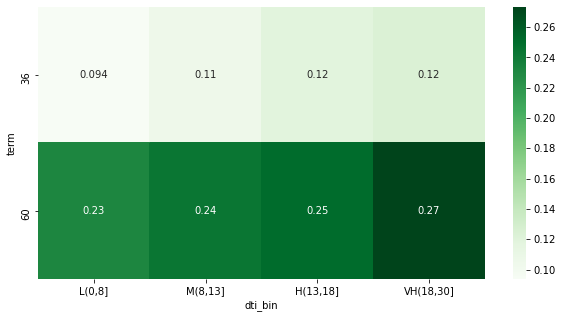

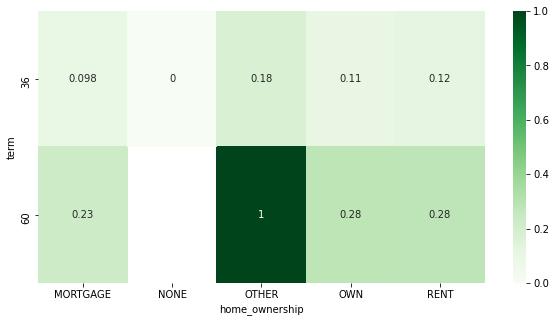

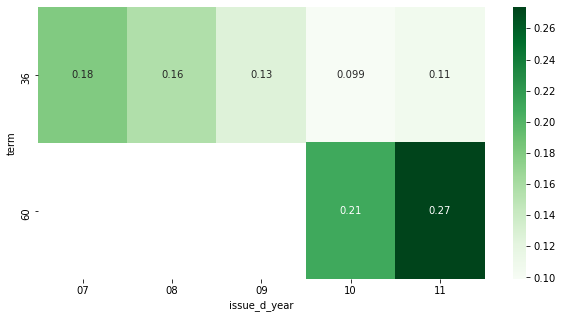

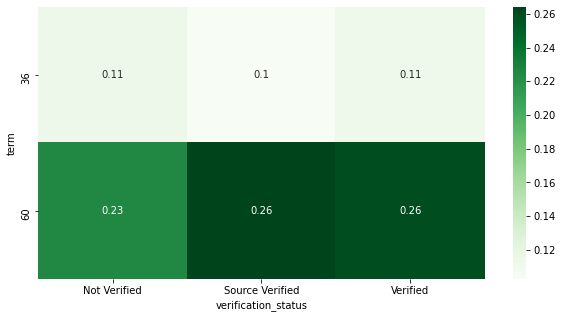

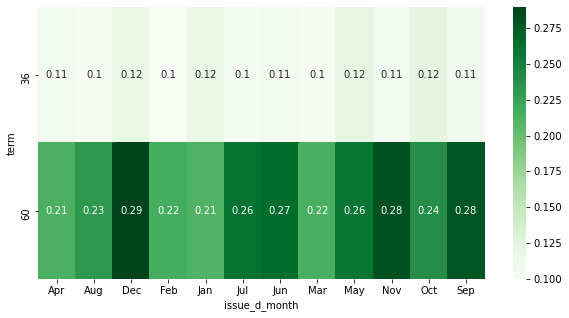

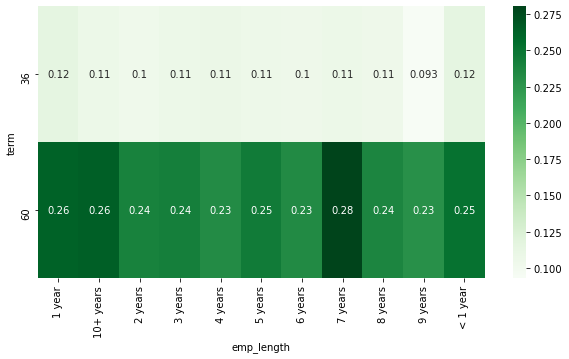

In [69]:
# Getting list of all the columns except given input
SLb = Col_list('term','annual_inc_bin','total_acc_bin','open_acc_bin','inq_last_6mths','purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'term' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='term',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

For the plots:

1) term vs revol_util_bin<br>
    the defaulters rate increase with the increase in term and increase in revol_util_bin
    
2) term vs funded_amnt_bin<br>
    the defaulters rate increases independently with the increase in term irrespective of funded_amnt_bin

3) term vs dti_bin<br>
    the defaulters rate increases independently with the increase in term irrespective of dti_bin

4) term vs verification_status<br>
    the defaulters rate increases independently with the increase in term irrespective of verification_status

5) term vs issue_d_month<br>
    the defaulters rate increases independently with the increase in term irrespective of issue_d_month
    
6) term vs emp_length<br>
    the defaulters rate increases independently with the increase in term irrespective of emp_length

###### Plotting bar graphs for the above insights

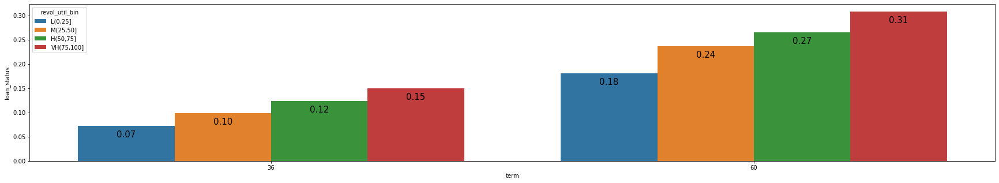

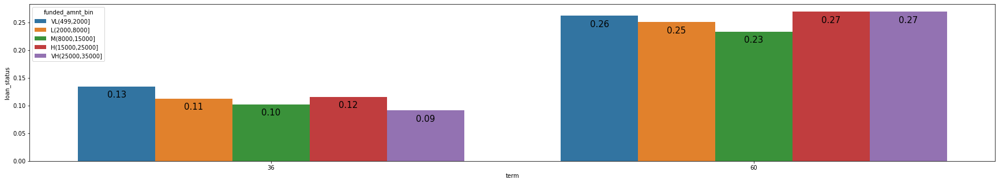

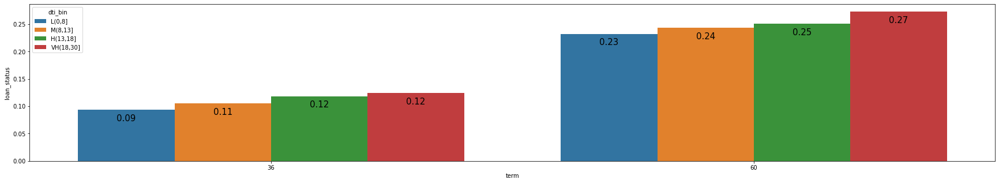

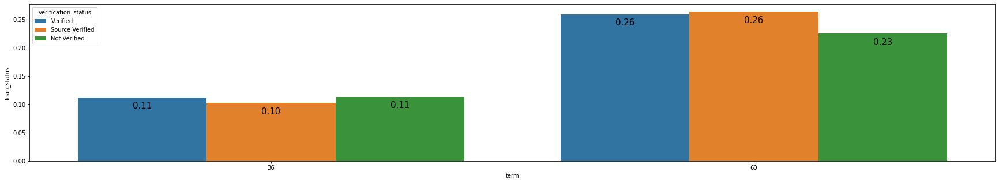

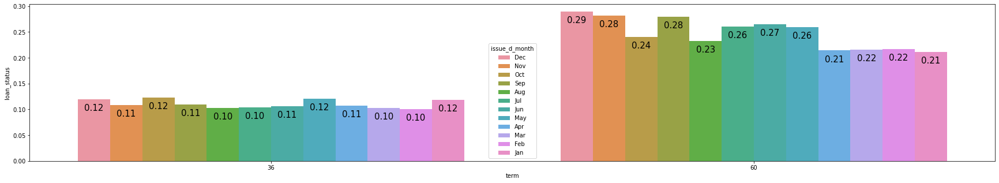

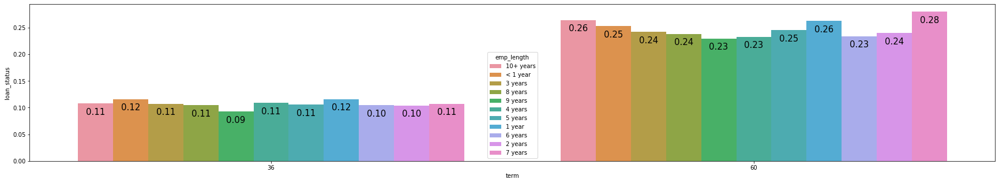

In [70]:
Lt = ['revol_util_bin','funded_amnt_bin','dti_bin','verification_status','issue_d_month','emp_length']

for i in Lt:
    plt.figure(figsize=[30,5])
    plots = sns.barplot(x='term' , y="loan_status", hue = i, data=lda, ci = None) 
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                    (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                    size=15, xytext=(0, -15), 
                    textcoords='offset points')
    plt.show()

#### 4.1j) Plotting 'revol_util_bin' with all other remaining columns

['funded_amnt_bin', 'dti_bin', 'home_ownership', 'issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


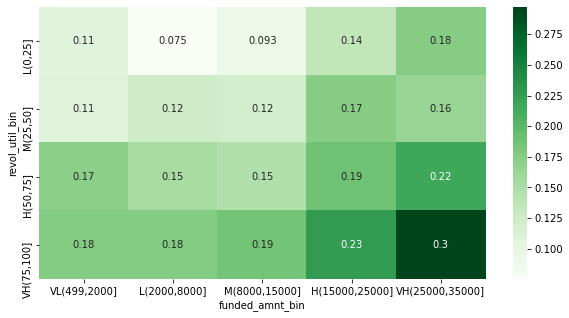

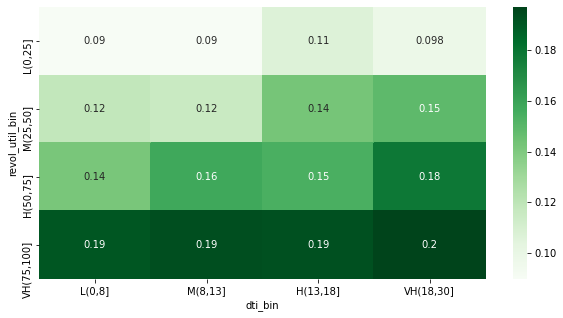

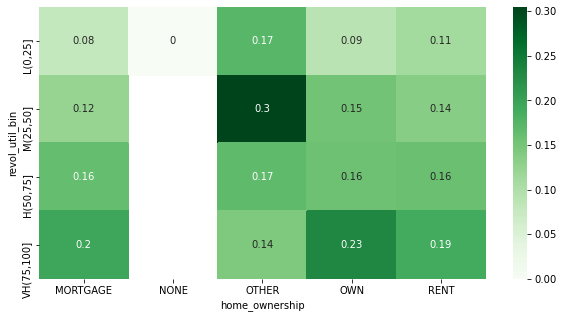

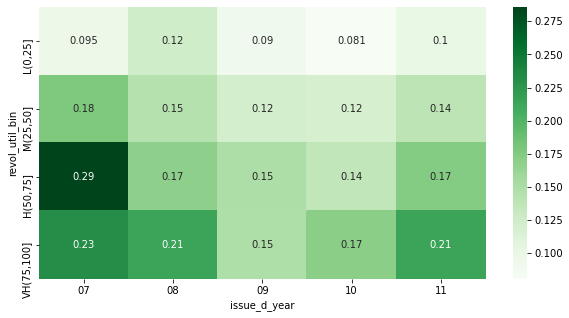

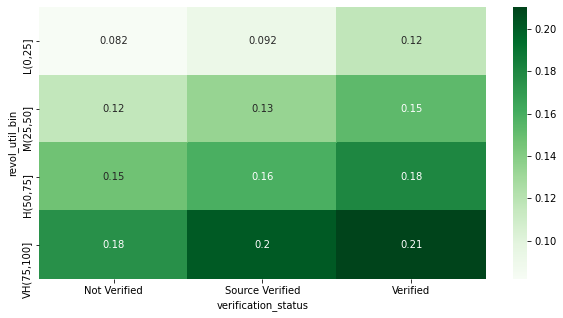

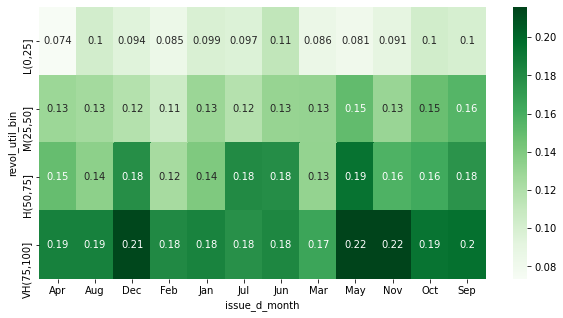

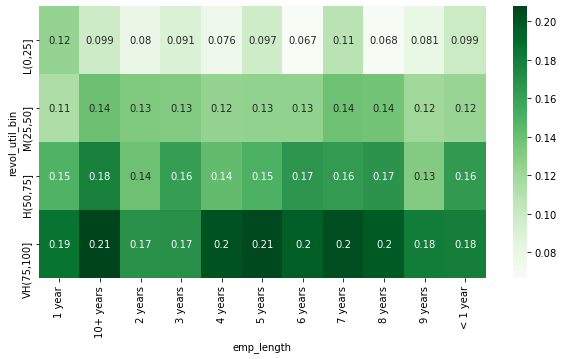

In [71]:
# Getting list of all the columns except given input
SLb = Col_list('revol_util_bin','term','annual_inc_bin','total_acc_bin','open_acc_bin','inq_last_6mths','purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'revol_util_bin' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='revol_util_bin',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

For the plots:

1) revol_util_bin vs funded_amnt_bin<br>
    the defaulters rate increase with the increase in revol_util_bin and increase in funded_amnt_bin
    
2) revol_util_bin vs dti_bin<br>
    the defaulters rate increase with the increase in revol_util_bin and increase in dti_bin

3) revol_util_bin vs verification_status<br>
    the defaulters rate increases independently with the increase in term from Not Verified to Verified increasing order



###### Plotting bar graphs for the above insights

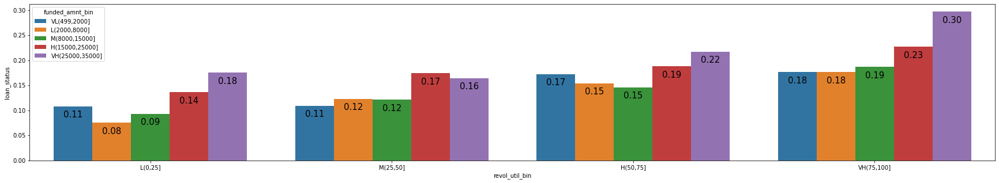

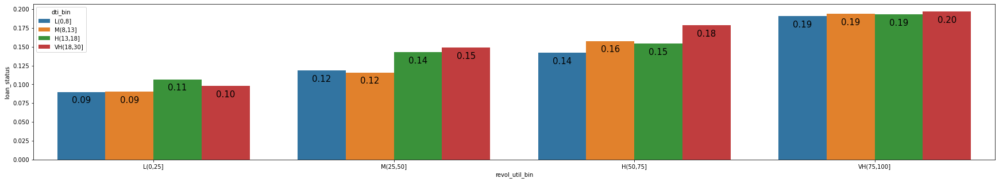

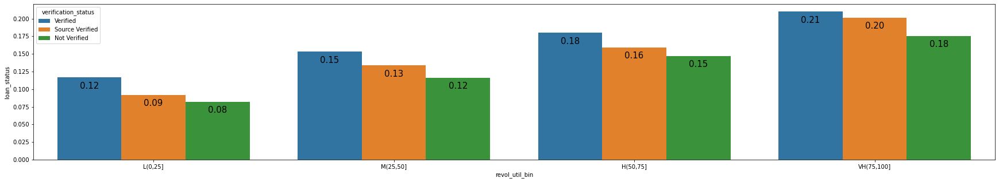

In [72]:
Lt = ['funded_amnt_bin','dti_bin','verification_status']

for i in Lt:
    plt.figure(figsize=[30,5])
    plots = sns.barplot(x='revol_util_bin' , y="loan_status", hue = i, data=lda, ci = None) 
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                    (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                    size=15, xytext=(0, -15), 
                    textcoords='offset points')
    plt.show()

#### 4.1k) Plotting 'funded_amnt_bin' with all other remaining columns

['dti_bin', 'home_ownership', 'issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


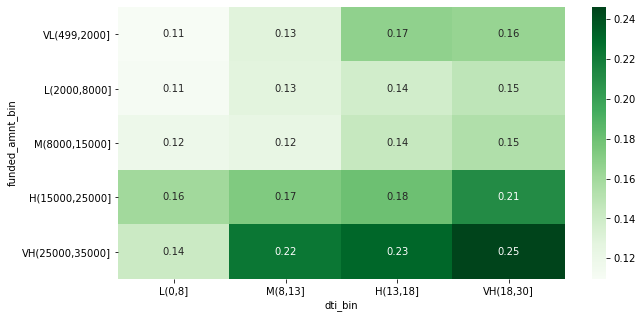

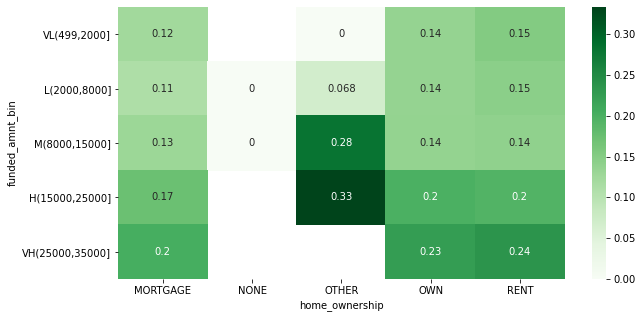

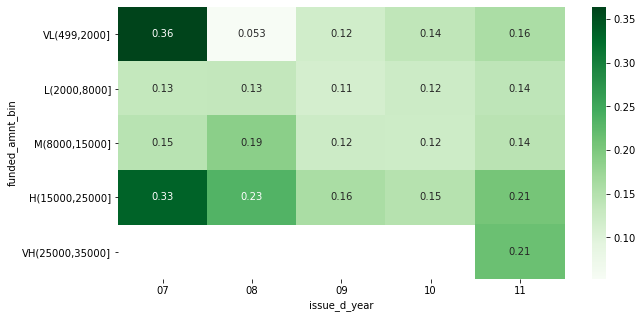

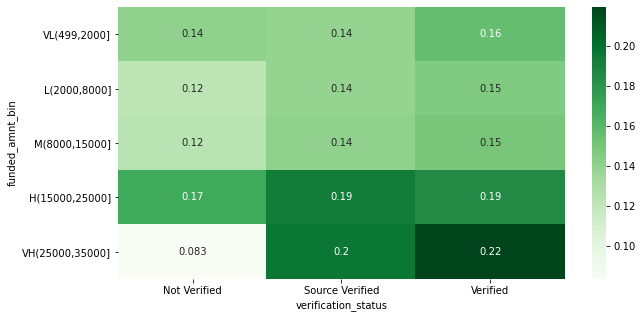

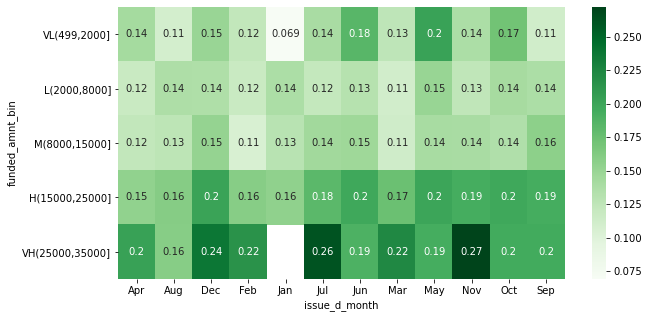

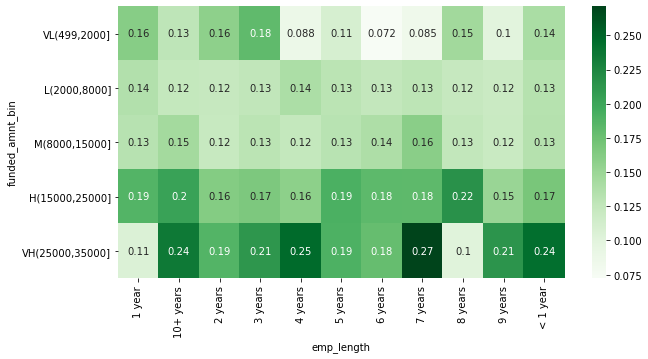

In [73]:
# Getting list of all the columns except given input
SLb = Col_list('funded_amnt_bin','revol_util_bin','term','annual_inc_bin','total_acc_bin','open_acc_bin','inq_last_6mths','purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'funded_amnt_bin' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='funded_amnt_bin',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

No insights found

#### 4.1l) Plotting 'dti_bin' with all other remaining columns

['home_ownership', 'issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


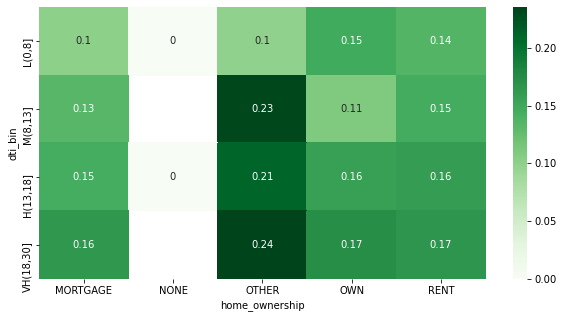

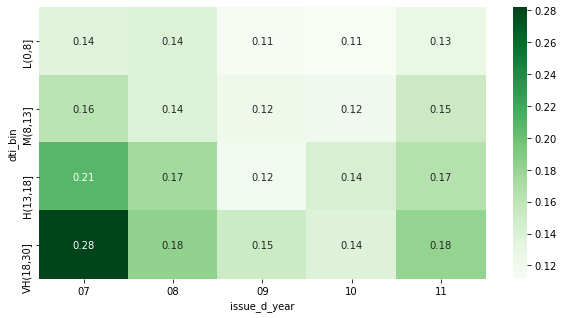

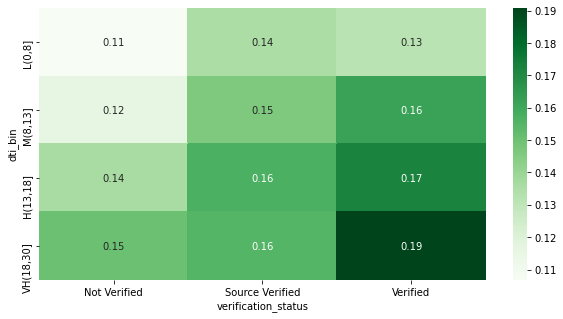

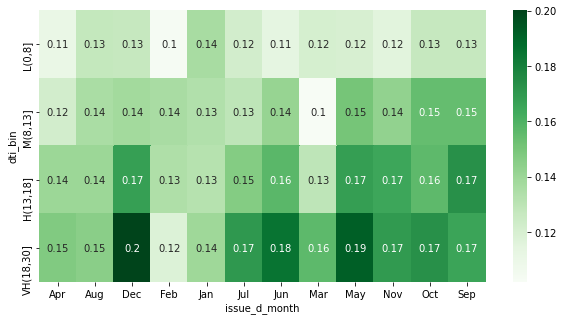

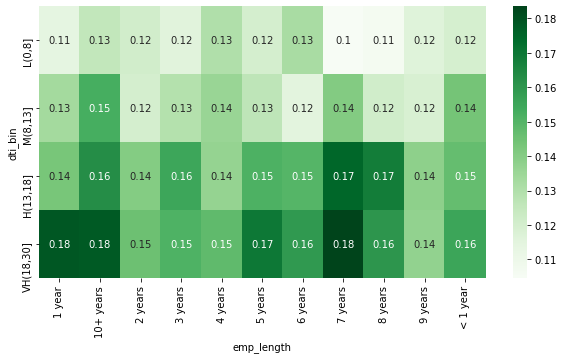

In [74]:
# Getting list of all the columns except given input
SLb = Col_list('dti_bin','funded_amnt_bin','revol_util_bin','term','annual_inc_bin','total_acc_bin','open_acc_bin','inq_last_6mths','purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'dti_bin' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='dti_bin',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

For the plots:

1) dti_bin vs verification_status<br>
    the defaulters rate increases with the increase in dti_bin and increase from Not Verified to Verified increasing order

###### Plotting bar graphs for the above insights

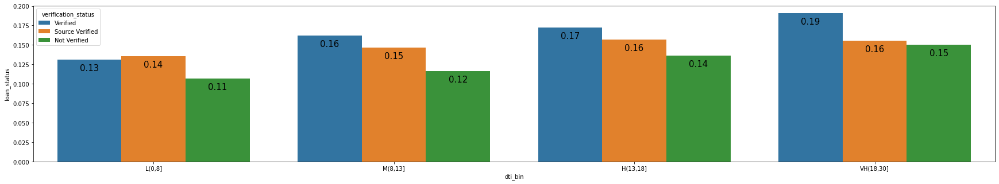

In [75]:
plt.figure(figsize=[30,5])
plots = sns.barplot(x='dti_bin' , y="loan_status", hue = 'verification_status', data=lda, ci = None) 
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.2f'),
                (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                    size=15, xytext=(0, -15), 
                    textcoords='offset points')
plt.show()

#### 4.1m) Plotting 'home_ownership' with all other remaining columns

['issue_d_year', 'verification_status', 'issue_d_month', 'emp_length']


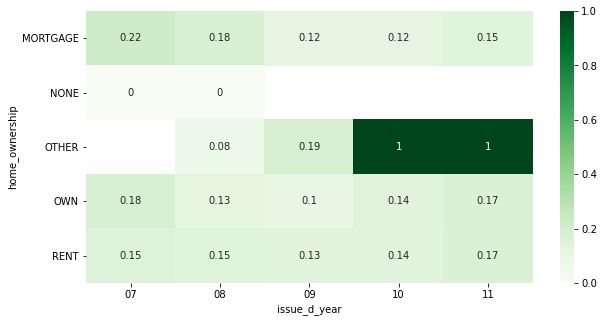

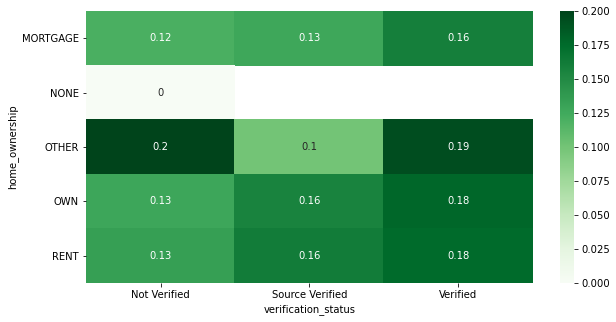

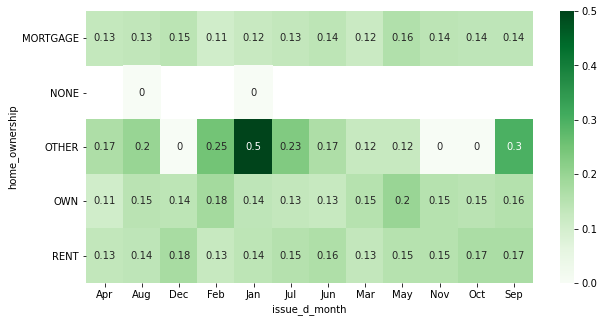

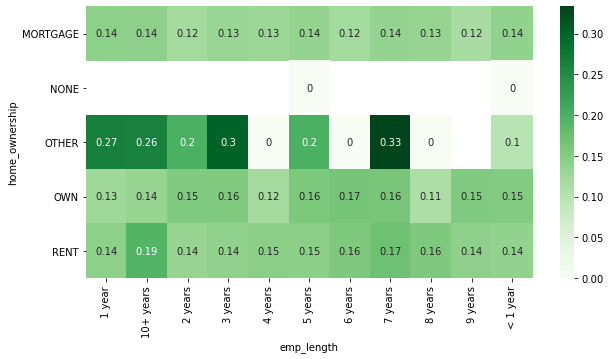

In [76]:
# Getting list of all the columns except given input
SLb = Col_list('home_ownership','dti_bin','funded_amnt_bin','revol_util_bin','term','annual_inc_bin','total_acc_bin','open_acc_bin','inq_last_6mths','purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'home_ownership' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='home_ownership',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

No insight found

#### 4.1n) Plotting 'issue_d_year' with all other remaining columns

['verification_status', 'issue_d_month', 'emp_length']


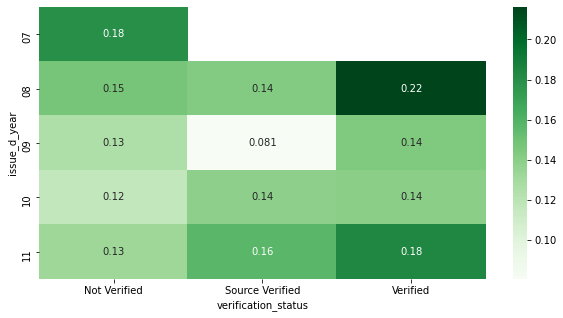

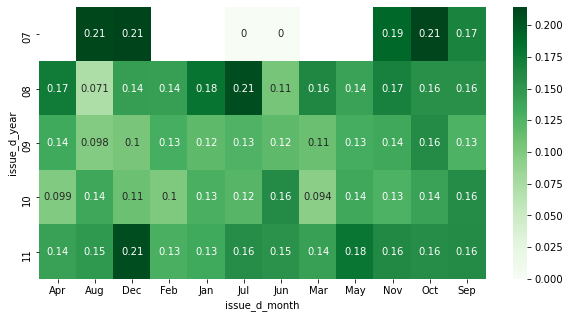

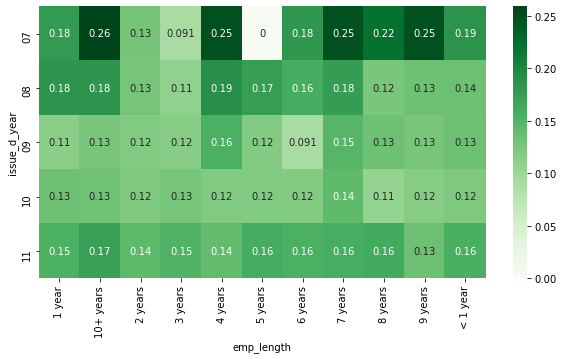

In [77]:
# Getting list of all the columns except except given input
SLb = Col_list('issue_d_year','home_ownership','dti_bin','funded_amnt_bin','revol_util_bin','term','annual_inc_bin','total_acc_bin','open_acc_bin','inq_last_6mths','purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'issue_d_year' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='issue_d_year',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

No insight found

#### 4.1o) Plotting 'verification_status' with all other remaining columns

['issue_d_month', 'emp_length']


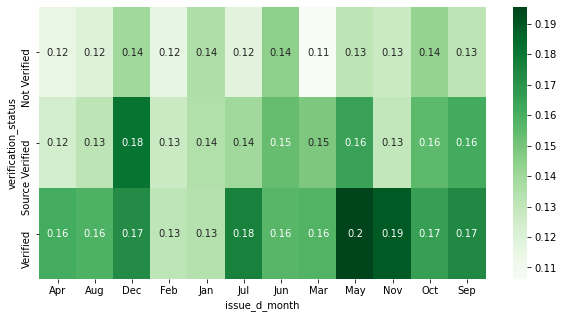

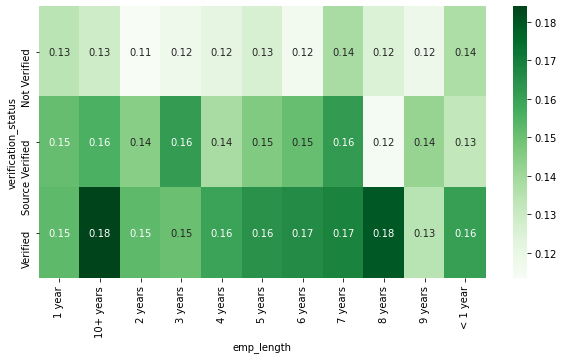

In [78]:
# Getting list of all the columns except given input
SLb = Col_list('verification_status','issue_d_year','home_ownership','dti_bin','funded_amnt_bin','revol_util_bin','term','annual_inc_bin','total_acc_bin','open_acc_bin','inq_last_6mths','purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'verification_status' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='verification_status',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

No insight found

#### 4.1p) Plotting 'issue_d_month' with all other remaining columns

['emp_length']


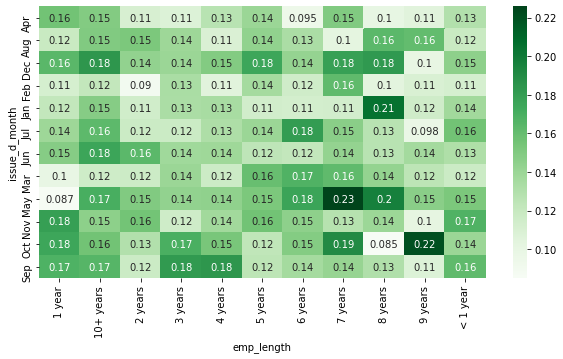

In [79]:
# Getting list of all the columns except given input
SLb = Col_list('issue_d_month','verification_status','issue_d_year','home_ownership','dti_bin','funded_amnt_bin','revol_util_bin','term','annual_inc_bin','total_acc_bin','open_acc_bin','inq_last_6mths','purpose','pub_rec','pub_rec_bankruptcies','int_rate_bin')
print(SLb)

# Getting heat maps for 'issue_d_month' vs all remaining columns
for i in SLb:    
    res=pd.pivot_table(data=lda,index='issue_d_month',columns=i,values="loan_status",aggfunc=np.mean)
    plt.figure(figsize=[10,5])
    sns.heatmap(res,cmap="Greens", annot=True)
    plt.show()

No insight found

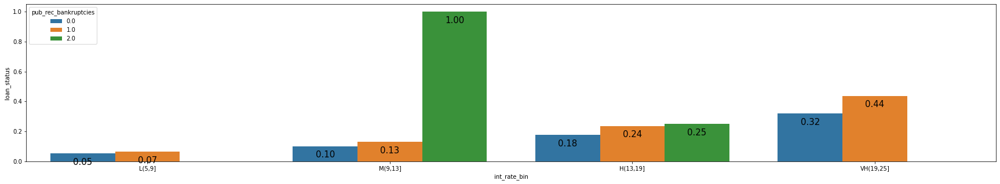

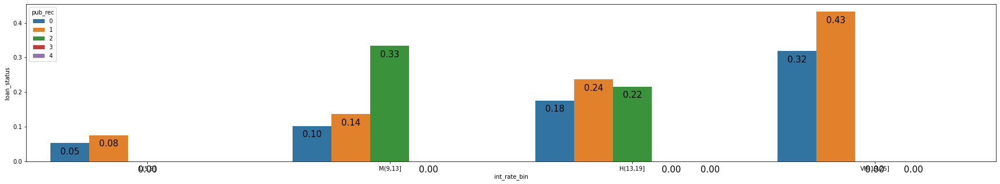

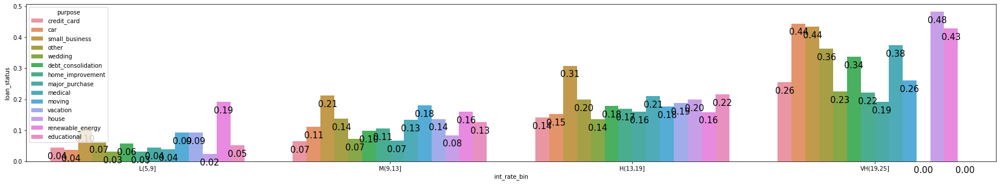

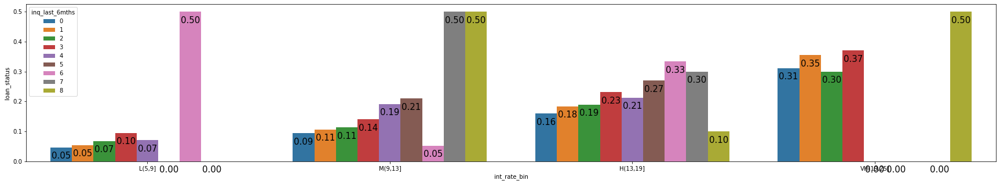

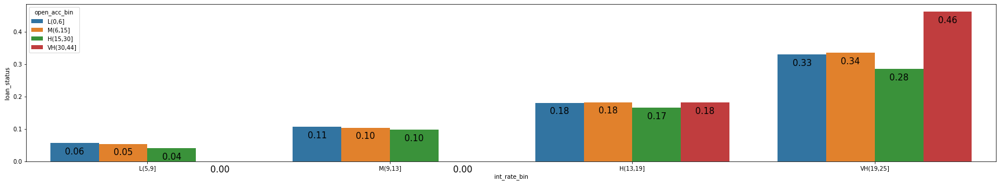

...

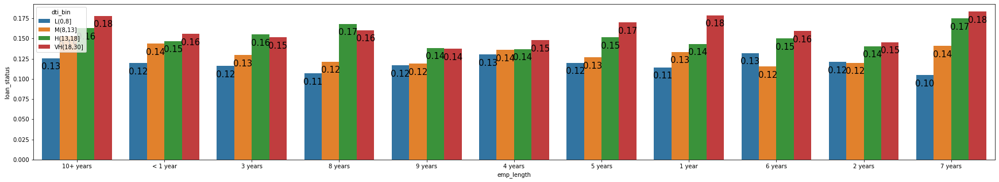

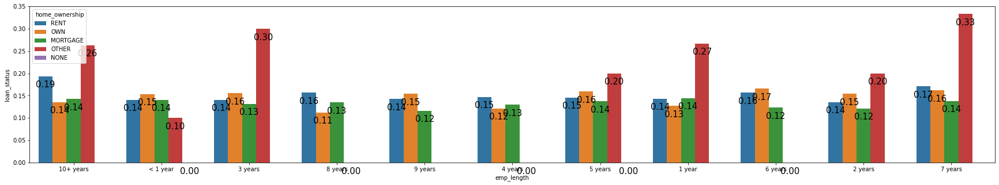

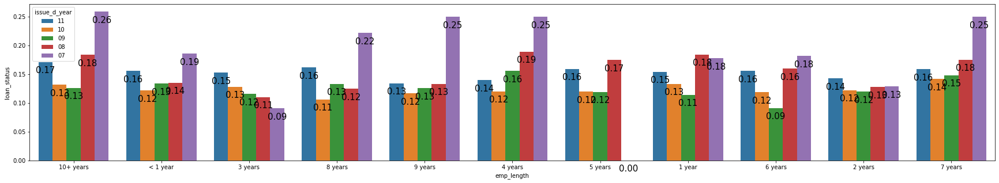

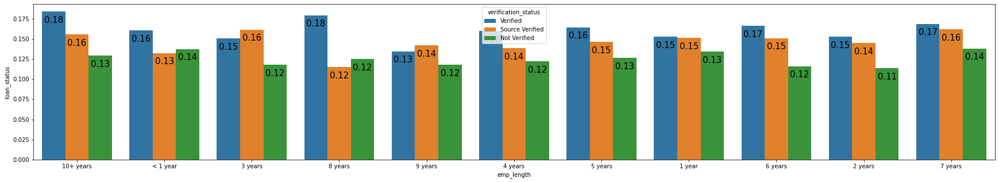

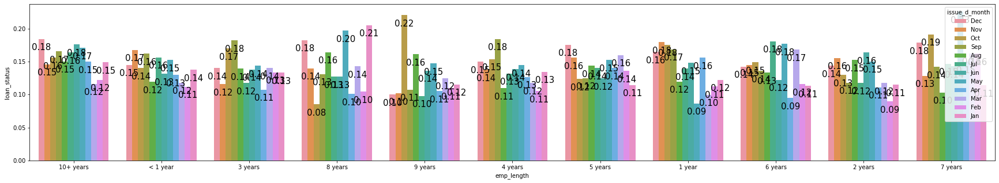

In [80]:
# Getting heat maps for all combinations of columns for which univariate analysis is performed
for i in SLu:
    for j in SLu:
        if i != j:            
            plt.figure(figsize=[30,5])
            plots = sns.barplot(x=i , y="loan_status", hue = j, data=lda, ci = None) 
            for bar in plots.patches:
                plots.annotate(format(bar.get_height(), '.2f'),
                    (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                    size=15, xytext=(0, -15), 
                    textcoords='offset points')
    plt.show()